.

.

.

.

.

.

In [ ]:
.
.
.
.
.

In [ ]:
.

## Key Question 1:

### Are we seeing any lead quality trends over time (improving or declining)? Are they statistically significant? 
### Solution:

In [1]:
## loading the dataset

import pandas as pd
df = pd.read_excel('data.xls')

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3021 entries, 0 to 3020
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   LeadCreated                  3021 non-null   datetime64[ns]
 1   FirstName                    3021 non-null   object        
 2   Email                        3021 non-null   object        
 3   VendorLeadID                 3013 non-null   object        
 4   CallStatus                   881 non-null    object        
 5   WidgetName                   3021 non-null   object        
 6   PublisherZoneName            3021 non-null   object        
 7   PublisherCampaignName        3021 non-null   object        
 8   AddressScore                 1171 non-null   float64       
 9   PhoneScore                   1393 non-null   float64       
 10  AdvertiserCampaignName       3021 non-null   object        
 11  State                        3021 non-null 

In [3]:
# checking for null values

df.isnull().sum()

LeadCreated                       0
FirstName                         0
Email                             0
VendorLeadID                      8
CallStatus                     2140
WidgetName                        0
PublisherZoneName                 0
PublisherCampaignName             0
AddressScore                   1850
PhoneScore                     1628
AdvertiserCampaignName            0
State                             0
DebtLevel                         0
IP Address                     3021
Partner                           0
ReferralDomain                  515
MarketingCampaign               272
AdGroup                         272
Keyword                        2042
SearchQuery                    1756
ReferralURL                     515
ReferralURL Parameters          738
LandingPageURL                    0
Landing Page URL Parameters       0
dtype: int64

The provided dataset contains lot of null values with CallStatus column having 2140 null values.

The distribution of leads across various categories of Call Status is as follows:

In [4]:
df['CallStatus'].value_counts()

CallStatus
Closed                                         245
Contacted - Doesn't Qualify                    212
Unable to contact - Bad Contact Information    191
EP Confirmed                                   130
Contacted - Invalid Profile                     85
EP Sent                                         16
EP Received                                      2
Name: count, dtype: int64

## Grouping Leads by Quality:

To analyse lead quality trends, the dataset was grouped into broader quality categories based on the CallStatus column. This was achieved by defining a custom Python function, classify_lead, which assigns each lead to a specific quality group. The goal was to simplify the analysis and identify trends in lead quality over time.

Function Explanation

The function classify_lead categorizes the CallStatus values into 4 main groups:

1.	Closed:
Leads marked as "Closed" were retained in a separate category to represent successfully closed leads.

2.	Good Lead Quality:
This group includes statuses indicating progress in the engagement process:
"EP Sent", "EP Received" and "EP Confirmed"

3.	Bad Lead Quality:
This group consists of statuses reflecting issues or failures in the engagement process:
"Unable to contact - Bad Contact Information" or "Contacted - Invalid Profile" or "Contacted - Doesn't Qualify"

4.	Unknown Quality:
Any other statuses not falling into the above categories would be classified as "Unknown Quality" 


In [5]:
def classify_lead(status):
    if status == "Closed":
        return "Closed"
    elif status in ["EP Sent", "EP Received", "EP Confirmed"]:
        return "Good Lead Quality"
    elif status in ["Unable to contact - Bad Contact Information", "Contacted - Invalid Profile", "Contacted - Doesn't Qualify"]:
        return "Bad Lead Quality"
    else:
        return "Unknown Quality"
    
df['LeadQualityGroup'] = df['CallStatus'].apply(classify_lead)

This led to the following distribution in data:

In [6]:
df['LeadQualityGroup'].value_counts()

LeadQualityGroup
Unknown Quality      2140
Bad Lead Quality      488
Closed                245
Good Lead Quality     148
Name: count, dtype: int64

### Extracting Month and Day Features for Lead Quality Trends

In order to analyze lead quality trends over both short-term (daily) and long-term (monthly) periods, we will create two new features:

- **Month**: This feature extracts the year and month from the `LeadCreated` timestamp in the format `%Y-%m`, allowing for grouping of data by month.
- **Day**: This feature extracts the full date from the `LeadCreated` timestamp in the format `%Y-%m-%d`, enabling grouping of data by day.

These features will help in evaluating lead quality trends at different time granularities.

In [7]:
df_sorted = df.sort_values(by = 'LeadCreated')
df_sorted['month'] = df_sorted['LeadCreated'].dt.strftime('%Y-%m')
df_sorted['day'] = df_sorted['LeadCreated'].dt.strftime('%Y-%m-%d')

### Step 1: Assigning Quality Flags for Each Lead

The following code creates binary indicators for each lead's quality based on its group (LeadQualityGroup).

In [8]:
df_sorted['is_closed'] = df_sorted.apply(lambda row: 1 if row['LeadQualityGroup'] == 'Closed' else 0, axis=1)
df_sorted['is_bad_lead_quality'] = df_sorted.apply(lambda row: 1 if row['LeadQualityGroup'] == 'Bad Lead Quality' else 0, axis=1)
df_sorted['is_good_lead_quality'] = df_sorted.apply(lambda row: 1 if row['LeadQualityGroup'] == 'Good Lead Quality' else 0, axis=1)
df_sorted['is_unknown_quality'] = df_sorted.apply(lambda row: 1 if row['LeadQualityGroup'] == 'Unknown Quality' else 0, axis=1)

Each apply function creates a new binary column for each lead quality group:
 - is_closed: 1 if the lead is in the "Closed" group, otherwise 0.
 - is_bad_lead_quality: 1 if the lead is classified as "Bad Lead Quality", otherwise 0.
 - is_good_lead_quality: 1 if the lead is classified as "Good Lead Quality", otherwise 0.
 - is_unknown_quality: 1 if the lead has an "Unknown Quality", otherwise 0.

These binary columns represent whether a lead belongs to a particular quality category.

### Step 2: Grouping Data by Month
After categorizing each lead, the data is aggregated by month using the groupby function.

In [9]:
df_by_month = df_sorted.groupby('month').agg({
    'is_closed': sum, 
    'is_bad_lead_quality': sum, 
    'is_good_lead_quality': sum, 
    'is_unknown_quality': sum 
}).reset_index()

C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\3920978131.py:1: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_by_month = df_sorted.groupby('month').agg({
C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\3920978131.py:1: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_by_month = df_sorted.groupby('month').agg({


- The groupby('month') operation groups the data by the 'month' feature.
 - The agg function calculates the sum of each quality flag (is_closed, is_bad_lead_quality, is_good_lead_quality, is_unknown_quality) for each month,
 - giving us the total count of leads in each category per month.

### Step 3: Calculate Total Leads per Month

In [10]:
df_by_month['total'] = df_by_month['is_closed'] + df_by_month['is_bad_lead_quality'] + df_by_month['is_good_lead_quality'] + df_by_month['is_unknown_quality']

### Step 4: Calculating Ratios for Lead Quality Categories by Month

In [11]:
df_by_month['is_closed_ratio'] = df_by_month['is_closed'] / df_by_month['total']
df_by_month['is_bad_lead_quality_ratio'] = df_by_month['is_bad_lead_quality'] / df_by_month['total']
df_by_month['is_good_lead_quality_ratio'] = df_by_month['is_good_lead_quality'] / df_by_month['total']
df_by_month['is_unknown_quality_ratio'] = df_by_month['is_unknown_quality'] / df_by_month['total']

These new columns represent the ratio of leads in each category for every month:
 - is_closed_ratio: The proportion of closed leads for that month.
 - is_bad_lead_quality_ratio: The proportion of bad quality leads.
 - is_good_lead_quality_ratio: The proportion of good quality leads.
 - is_unknown_quality_ratio: The proportion of leads with unknown quality.

### Step 5: Grouping Data by Day
Similarly to the monthly aggregation, the code also groups the data by day to observe daily trends.

In [12]:
df_by_day = df_sorted.groupby('day').agg({
    'is_closed': sum,
    'is_bad_lead_quality': sum, 
    'is_good_lead_quality': sum, 
    'is_unknown_quality': sum 
}).reset_index()


C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\2424118188.py:1: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_by_day = df_sorted.groupby('day').agg({
C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\2424118188.py:1: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_by_day = df_sorted.groupby('day').agg({


### Step 6: Calculating Daily Totals and Ratios

In [13]:
df_by_day['total'] = (
    df_by_day['is_closed'] +
    df_by_day['is_bad_lead_quality'] +
    df_by_day['is_good_lead_quality'] +
    df_by_day['is_unknown_quality']
)

df_by_day['is_closed_ratio'] = df_by_day['is_closed'] / df_by_day['total']
df_by_day['is_bad_lead_quality_ratio'] = df_by_day['is_bad_lead_quality'] / df_by_day['total']
df_by_day['is_good_lead_quality_ratio'] = df_by_day['is_good_lead_quality'] / df_by_day['total']
df_by_day['is_unknown_quality_ratio'] = df_by_day['is_unknown_quality'] / df_by_day['total']

### Step 7: Lead Quality Ratios with trendline by Month

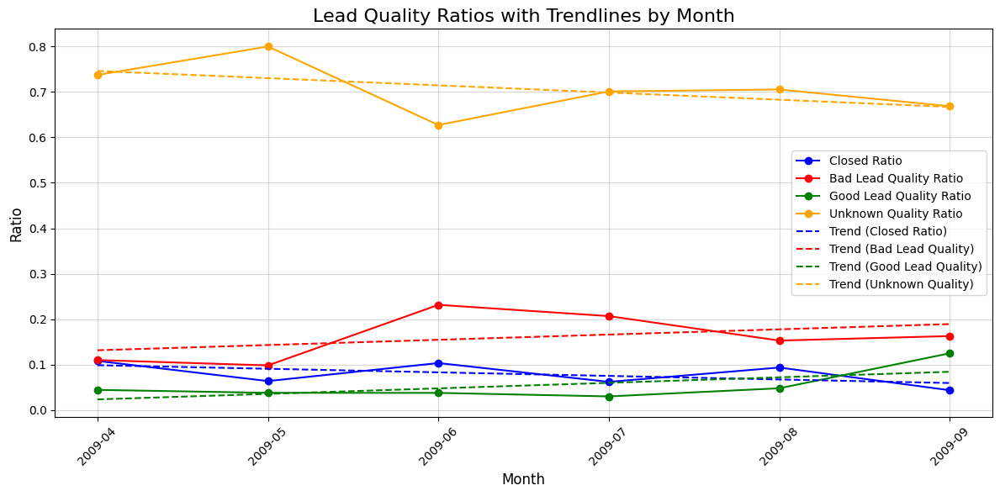

In [14]:
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Convert month to numeric values for regression model
df_by_month['month_num'] = np.arange(len(df_by_month))  # Assign numeric values to months

# Initialize the regressor
regressor = LinearRegression()

# Fitting the model and creating trendlines for each lead quality category
df_by_month['trend_closed'] = regressor.fit(df_by_month[['month_num']], df_by_month['is_closed_ratio']).predict(df_by_month[['month_num']])
df_by_month['trend_bad_lead'] = regressor.fit(df_by_month[['month_num']], df_by_month['is_bad_lead_quality_ratio']).predict(df_by_month[['month_num']])
df_by_month['trend_good_lead'] = regressor.fit(df_by_month[['month_num']], df_by_month['is_good_lead_quality_ratio']).predict(df_by_month[['month_num']])
df_by_month['trend_unknown'] = regressor.fit(df_by_month[['month_num']], df_by_month['is_unknown_quality_ratio']).predict(df_by_month[['month_num']])

# Step 9: Plotting the Data and Trendlines
# Plotting setup
plt.figure(figsize=(12, 6))

# Colors for each line
colors = {
    'Closed Ratio': 'blue',
    'Bad Lead Quality Ratio': 'red',
    'Good Lead Quality Ratio': 'green',
    'Unknown Quality Ratio': 'orange'
}

# Plot original data and trendlines
plt.plot(df_by_month['month'], df_by_month['is_closed_ratio'], label='Closed Ratio', marker='o', color=colors['Closed Ratio'])
plt.plot(df_by_month['month'], df_by_month['is_bad_lead_quality_ratio'], label='Bad Lead Quality Ratio', marker='o', color=colors['Bad Lead Quality Ratio'])
plt.plot(df_by_month['month'], df_by_month['is_good_lead_quality_ratio'], label='Good Lead Quality Ratio', marker='o', color=colors['Good Lead Quality Ratio'])
plt.plot(df_by_month['month'], df_by_month['is_unknown_quality_ratio'], label='Unknown Quality Ratio', marker='o', color=colors['Unknown Quality Ratio'])

# Plot trendlines
plt.plot(df_by_month['month'], df_by_month['trend_closed'], label='Trend (Closed Ratio)', linestyle='--', color=colors['Closed Ratio'])
plt.plot(df_by_month['month'], df_by_month['trend_bad_lead'], label='Trend (Bad Lead Quality)', linestyle='--', color=colors['Bad Lead Quality Ratio'])
plt.plot(df_by_month['month'], df_by_month['trend_good_lead'], label='Trend (Good Lead Quality)', linestyle='--', color=colors['Good Lead Quality Ratio'])
plt.plot(df_by_month['month'], df_by_month['trend_unknown'], label='Trend (Unknown Quality)', linestyle='--', color=colors['Unknown Quality Ratio'])

# Customize the plot
plt.title('Lead Quality Ratios with Trendlines by Month', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Ratio', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
plt.grid(alpha=0.5)
plt.tight_layout()

# Show the plot
plt.show()


### Step 8: Lead Quality Ratios with trendline by Day

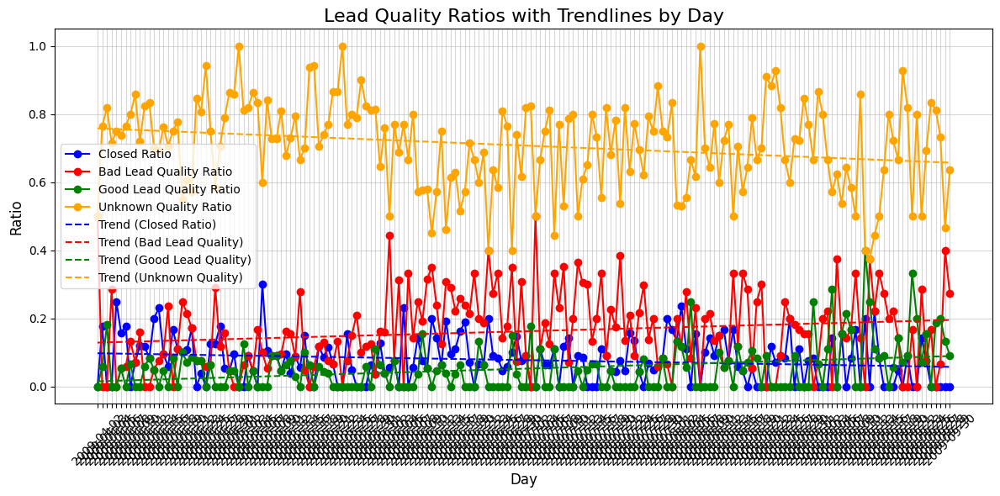

In [15]:
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Convert day to numeric values for regression model
df_by_day['day_num'] = np.arange(len(df_by_day))  # Assign numeric values to days

# Initialize the regressor
regressor = LinearRegression()

# Fitting the model and creating trendlines for each lead quality category
df_by_day['trend_closed'] = regressor.fit(df_by_day[['day_num']], df_by_day['is_closed_ratio']).predict(df_by_day[['day_num']])
df_by_day['trend_bad_lead'] = regressor.fit(df_by_day[['day_num']], df_by_day['is_bad_lead_quality_ratio']).predict(df_by_day[['day_num']])
df_by_day['trend_good_lead'] = regressor.fit(df_by_day[['day_num']], df_by_day['is_good_lead_quality_ratio']).predict(df_by_day[['day_num']])
df_by_day['trend_unknown'] = regressor.fit(df_by_day[['day_num']], df_by_day['is_unknown_quality_ratio']).predict(df_by_day[['day_num']])

# Step 9: Plotting the Data and Trendlines for daily data
# Plotting setup
plt.figure(figsize=(12, 6))

# Colors for each line
colors = {
    'Closed Ratio': 'blue',
    'Bad Lead Quality Ratio': 'red',
    'Good Lead Quality Ratio': 'green',
    'Unknown Quality Ratio': 'orange'
}

# Plot original data and trendlines
plt.plot(df_by_day['day'], df_by_day['is_closed_ratio'], label='Closed Ratio', marker='o', color=colors['Closed Ratio'])
plt.plot(df_by_day['day'], df_by_day['is_bad_lead_quality_ratio'], label='Bad Lead Quality Ratio', marker='o', color=colors['Bad Lead Quality Ratio'])
plt.plot(df_by_day['day'], df_by_day['is_good_lead_quality_ratio'], label='Good Lead Quality Ratio', marker='o', color=colors['Good Lead Quality Ratio'])
plt.plot(df_by_day['day'], df_by_day['is_unknown_quality_ratio'], label='Unknown Quality Ratio', marker='o', color=colors['Unknown Quality Ratio'])

# Plot trendlines
plt.plot(df_by_day['day'], df_by_day['trend_closed'], label='Trend (Closed Ratio)', linestyle='--', color=colors['Closed Ratio'])
plt.plot(df_by_day['day'], df_by_day['trend_bad_lead'], label='Trend (Bad Lead Quality)', linestyle='--', color=colors['Bad Lead Quality Ratio'])
plt.plot(df_by_day['day'], df_by_day['trend_good_lead'], label='Trend (Good Lead Quality)', linestyle='--', color=colors['Good Lead Quality Ratio'])
plt.plot(df_by_day['day'], df_by_day['trend_unknown'], label='Trend (Unknown Quality)', linestyle='--', color=colors['Unknown Quality Ratio'])

# Customize the plot
plt.title('Lead Quality Ratios with Trendlines by Day', fontsize=16)
plt.xlabel('Day', fontsize=12)
plt.ylabel('Ratio', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
plt.grid(alpha=0.5)
plt.tight_layout()

# Show the plot
plt.show()

Both Daily and Monthly trend chart suggests the same trend:

1. Closed Ratio (Blue Line):
This line appears relatively stable but shows a slight decrease over time, indicating that the ratio of closed leads is gradually decreasing from April to September 2009.

    Trend: The dashed blue trendline suggests a steady downward slope, indicating that less leads are being closed over the months.

2. Bad Lead Quality Ratio (Red Line):
The red line starts at a low point and gradually increases, indicating that the proportion of bad quality leads is increasing over time.

    Trend: The dashed red trendline also shows an upward slope, which reinforces the idea that the bad lead quality is deteorating over time.

3. Good Lead Quality Ratio (Green Line):
The green line appears to remain mostly flat in initial months but showing good improvements in the last couple of months, indicating that the proportion of good quality leads has slightly increased over the period shown.

    Trend: The dashed green trendline suggests a steady upward slope, suggesting that there is significant improvement in the good lead quality ratio.

4. Unknown Quality Ratio (Orange Line):
The orange line starts at a higher value and gradually decreases, suggesting that the number of leads with unknown quality is dropping over time.

    Trend: The dashed orange trendline shows a downward trend, indicating that the leads with unknown quality are being classified or resolved over time.

### Step 9: Seasonal and Trend decomposition

This method helps to understand the underlying patterns (trend), repeating cycles (seasonality), and the irregularities (residual) in the time series data, which can be useful for forecasting or anomaly detection.

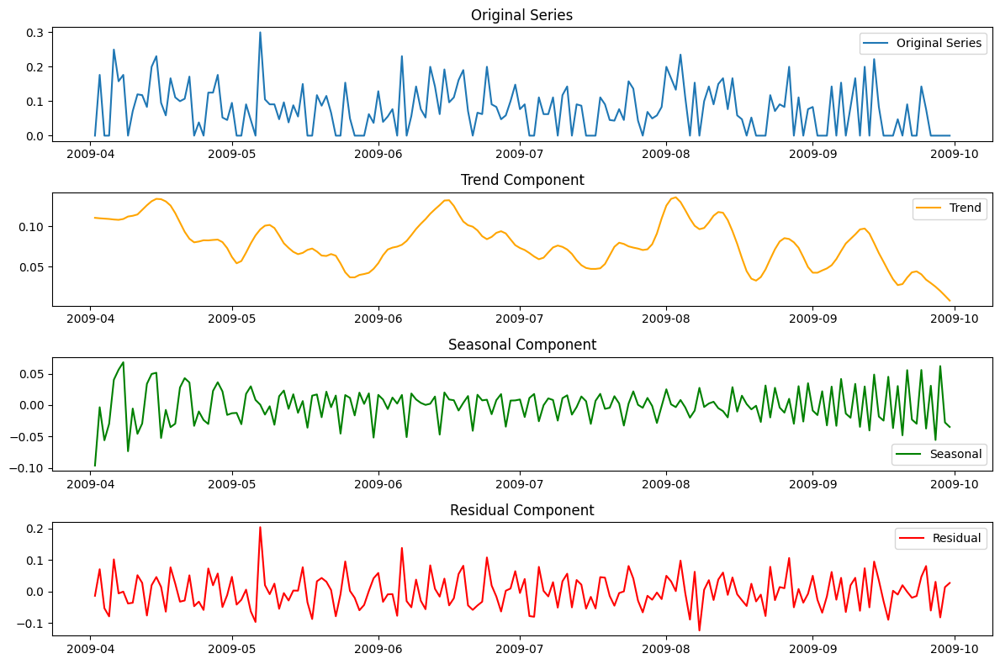

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

df_by_day['day'] = pd.to_datetime(df_by_day['day'])

# Set 'date' as the index
df_by_day.set_index('day', inplace=True)

# 'is_closed_ratio' is the column to be decomposed
series = df_by_day['is_closed_ratio']

# Perform STL Decomposition
stl = STL(series, seasonal=13)  # You can adjust the seasonal period (e.g., 12 for monthly data)
result = stl.fit()

# Extract the decomposed components
trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot the decomposed components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(series, label='Original Series')
plt.legend(loc='best')
plt.title('Original Series')

plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='best')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residual', color='red')
plt.legend(loc='best')
plt.title('Residual Component')

plt.tight_layout()
plt.show()


The image shows the results of a time series decomposition using STL (Seasonal and Trend decomposition using Loess). Here's how to interpret each component:

- Original Series (Top Plot):

    The top plot displays the raw data (is_closed_ratio) over time. It shows significant fluctuations with some patterns, which are typical in time series data, where the values seem to vary frequently but may also exhibit underlying trends and seasonality.
 
- Trend Component (Second Plot):
    The second plot (orange line) represents the long-term trend of the data. It shows the smooth, underlying pattern that captures the overall direction of the data over time. For example, the trend shows some upward and downward movement, suggesting that the is_closed_ratio may be increasing or decreasing over time.
    The trend helps to identify if the data has a consistent directional pattern (e.g., an increasing or decreasing trend) without being influenced by short-term fluctuations or seasonal effects.

- Seasonal Component (Third Plot):

    The third plot (green line) represents the seasonal component, which shows the repeating patterns or cycles in the data. It captures the fluctuations that occur at regular intervals (e.g., weekly, monthly, yearly). In this case, there seems to be a repetitive pattern with highs and lows that repeat at regular time intervals, which reflects seasonality in the data.
    This component helps identify periodic behavior or recurring trends that happen consistently over specific periods.
- Residual Component (Bottom Plot):

    The bottom plot (red line) represents the residual component, which is the remaining noise or randomness in the data after removing the trend and seasonal components.
    If the residuals are well-behaved (i.e., they look like random noise), it suggests that the model has successfully captured the main patterns in the data. However, if there are systematic patterns in the residuals, it might indicate that the model hasn't fully captured the data structure, and further adjustments or different modeling techniques might be needed.

General Observations:
Trend Component: Shows an overall direction in the data, which helps in understanding long-term changes.
Seasonal Component: Displays recurring cycles that could indicate seasonal behaviors, such as monthly or yearly patterns.
Residual Component: Captures random variations that cannot be explained by the trend or seasonality, showing how much of the data remains unexplained by the decomposition.
This decomposition is useful for analyzing and forecasting time series data, as it helps separate the noise from the meaningful patterns in the data.

### Step 10: Determining Statistical Significance of Observed Trends

In [17]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# Function to fit linear regression and return the p-value
def linear_regression_test(x, y):
    x = sm.add_constant(x)  # Adding constant term (intercept) to the model
    model = sm.OLS(y, x)    # Ordinary Least Squares regression
    results = model.fit()
    return results.pvalues[1]  # p-value for the slope

# Augmented Dickey-Fuller test to check for stationarity
def dickey_fuller_test(data, column_name):
    result = adfuller(data)
    print(f"ADF Test for {column_name}:")
    print(f"ADF Statistic: {result[0]}")
    print(f"P-value: {result[1]}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f'\t{key}: {value:.3f}')
    
    if result[1] < 0.05:
        print("The series is likely stationary (reject H0).")
    else:
        print("The series is likely non-stationary (fail to reject H0).")
    print("-" * 50)

# Assuming df_by_month contains the ratios calculated by month
# Ensure 'month' is a datetime type and set as the index
df_by_month['month'] = pd.to_datetime(df_by_month['month'])
df_by_month.set_index('month', inplace=True)

# Perform the ADF test for each ratio
dickey_fuller_test(df_by_month['is_closed_ratio'], 'Closed Ratio')
dickey_fuller_test(df_by_month['is_bad_lead_quality_ratio'], 'Bad Lead Quality Ratio')
dickey_fuller_test(df_by_month['is_good_lead_quality_ratio'], 'Good Lead Quality Ratio')
dickey_fuller_test(df_by_month['is_unknown_quality_ratio'], 'Unknown Quality Ratio')

# Now apply linear regression to find trends
# Convert the datetime index to numeric values for regression
df_by_month['month_numeric'] = (df_by_month.index - df_by_month.index[0]).days

p_value_closed = linear_regression_test(df_by_month['month_numeric'], df_by_month['is_closed_ratio'])
p_value_bad = linear_regression_test(df_by_month['month_numeric'], df_by_month['is_bad_lead_quality_ratio'])
p_value_good = linear_regression_test(df_by_month['month_numeric'], df_by_month['is_good_lead_quality_ratio'])
p_value_unknown = linear_regression_test(df_by_month['month_numeric'], df_by_month['is_unknown_quality_ratio'])

# Print the p-values from the linear regression model
print(f"P-value for Closed Ratio (Linear Regression): {p_value_closed}")
print(f"P-value for Bad Lead Quality Ratio (Linear Regression): {p_value_bad}")
print(f"P-value for Good Lead Quality Ratio (Linear Regression): {p_value_good}")
print(f"P-value for Unknown Quality Ratio (Linear Regression): {p_value_unknown}")

ADF Test for Closed Ratio:
ADF Statistic: 5.772681756471261
P-value: 1.0
Critical Values:
	1%: -7.355
	5%: -4.474
	10%: -3.127
The series is likely non-stationary (fail to reject H0).
--------------------------------------------------
ADF Test for Bad Lead Quality Ratio:
ADF Statistic: -14.115991216980998
P-value: 2.472121699364085e-26
Critical Values:
	1%: -7.355
	5%: -4.474
	10%: -3.127
The series is likely stationary (reject H0).
--------------------------------------------------
ADF Test for Good Lead Quality Ratio:
ADF Statistic: -0.47384894723964405
P-value: 0.897019465315062
Critical Values:
	1%: -7.355
	5%: -4.474
	10%: -3.127
The series is likely non-stationary (fail to reject H0).
--------------------------------------------------
ADF Test for Unknown Quality Ratio:
ADF Statistic: -9.223291857176102
P-value: 1.7563010375872932e-15
Critical Values:
	1%: -7.355
	5%: -4.474
	10%: -3.127
The series is likely stationary (reject H0).
------------------------------------------------

C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\3507258529.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return results.pvalues[1]  # p-value for the slope
C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\3507258529.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return results.pvalues[1]  # p-value for the slope
C:\Users\rajat.chauhan\AppData\Local\Temp\ipykernel_37244\3507258529.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by 

### Interpretation of P-Values:

In hypothesis testing, a p-value is used to determine whether the trend is statistically significant. 

Typically, a significance level α of 0.05 is used as the threshold:

If the p-value < 0.05, the trend is statistically significant.
If the p-value ≥ 0.05, the trend is not statistically significant.

Analysis of our results:
- Closed Ratio (P-value: 0.2493):
    The p-value is greater than 0.05.

    Conclusion: The trend in the closed ratio is not statistically significant. This means that the observed trend could be due to random variation rather than a true trend.

- Bad Lead Quality Ratio (P-value: 0.4177):

    The p-value is greater than 0.05.

    Conclusion: The trend in the bad lead quality ratio is not statistically significant. Any upward or downward movement in this ratio might just be noise.

- Good Lead Quality Ratio (P-value: 0.1660):

    The p-value is greater than 0.05.

    Conclusion: The trend in the good lead quality ratio is not statistically significant. Despite any visible patterns, they do not pass the threshold for statistical significance.

- Unknown Quality Ratio (P-value: 0.3088):

    The p-value is greater than 0.05.
    
    Conclusion: The trend in the unknown quality ratio is also not statistically significant. Any decline observed could be random.

### Final Conclusion:

None of the trends are statistically significant at the 
α = 0.05 level. 
This suggests that while you may observe some patterns in the charts (e.g., upward or downward slopes), these patterns are not strong enough to confidently state they are true trends rather than noise.

### Key Question 2. 

What can we learn about the drivers of "lead quality" from this dataset? What segments - where the ad was shown, what kind of person filled out the ad, what kind of ad did they see - have differing lead quality rates?

In [18]:
df_sorted.columns

Index(['LeadCreated', 'FirstName', 'Email', 'VendorLeadID', 'CallStatus',
       'WidgetName', 'PublisherZoneName', 'PublisherCampaignName',
       'AddressScore', 'PhoneScore', 'AdvertiserCampaignName', 'State',
       'DebtLevel', 'IP Address', 'Partner', 'ReferralDomain',
       'MarketingCampaign', 'AdGroup', 'Keyword', 'SearchQuery', 'ReferralURL',
       'ReferralURL Parameters', 'LandingPageURL',
       'Landing Page URL Parameters', 'LeadQualityGroup', 'month', 'day',
       'is_closed', 'is_bad_lead_quality', 'is_good_lead_quality',
       'is_unknown_quality'],
      dtype='object')

To automate the analysis across multiple categorical columns with the target column LeadQualityGroup, 

We can create a loop that does the following for each column:

- Define Columns: Define the list of categorical columns to analyze.

- Iterate Over Columns: Loop through each categorical column to perform the analysis.

- Value Counts: Display the frequency count of each unique value in the column.

- Heatmap of Contingency Table (Raw Counts): Visualize the raw counts of the contingency table using a heatmap.

- Heatmap of Expected Frequencies: Visualize the expected frequencies of the contingency table using a heatmap.

- Row Percentage Heatmap: Calculate and visualize the row-wise percentages (i.e., percentage of each category in the column relative to the total of its row).

- Column Percentage Heatmap: Calculate and visualize the column-wise percentages (i.e., percentage of each category in the LeadQualityGroup relative to the total of its column).

- Chi-Square Test: Perform a chi-square test of independence to test the association between the categorical column and LeadQualityGroup.

- Chi-Square Test Results: Print the results of the chi-square test, including the test statistic, degrees of freedom, and p-value.

- Check Significance: Compare the p-value to the significance level (alpha = 0.05) to determine if the association is statistically significant.


Analyzing Column: WidgetName

Value Counts for WidgetName:
WidgetName
w-302252-DebtReduction1-1DC-CreditSolutions     1054
w-302252-DebtReduction1-1DC-white                430
w-300250-DebtReduction1-1DC                      348
w-302252-DebtReduction1-1DC                      272
w-302252-DebtReduction1-1DC-yellowarrow-blue     232
w-302252-DebtReduction1-1DC-yellowarrow-dark     135
w-300250-DebtReduction1-1DC-BlueMeter             92
w-300250-DebtReduction1-1DC-Head2                 89
w-300250-DebtReduction1-2DC-BlueMeter             87
w-300250-DebtReduction1-1DC-CreditSolutions       77
w-300250-DebtReduction1-2DC-CreditSolutions       75
w-300250-DebtReduction1-1DC-Head3                 75
w-302252-DebtReduction1-1DC-yellowarrow           49
w-300250-DebtReduction1-1DC-white                  6
Name: count, dtype: int64


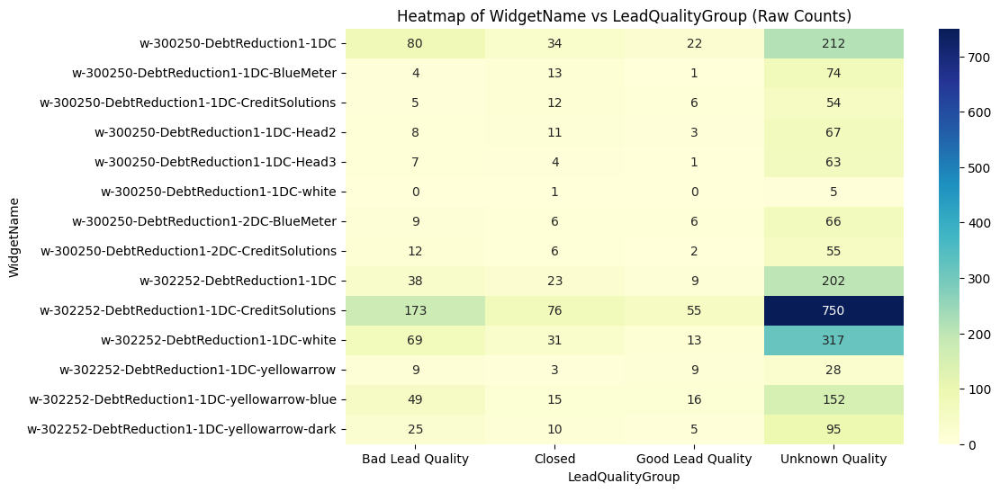

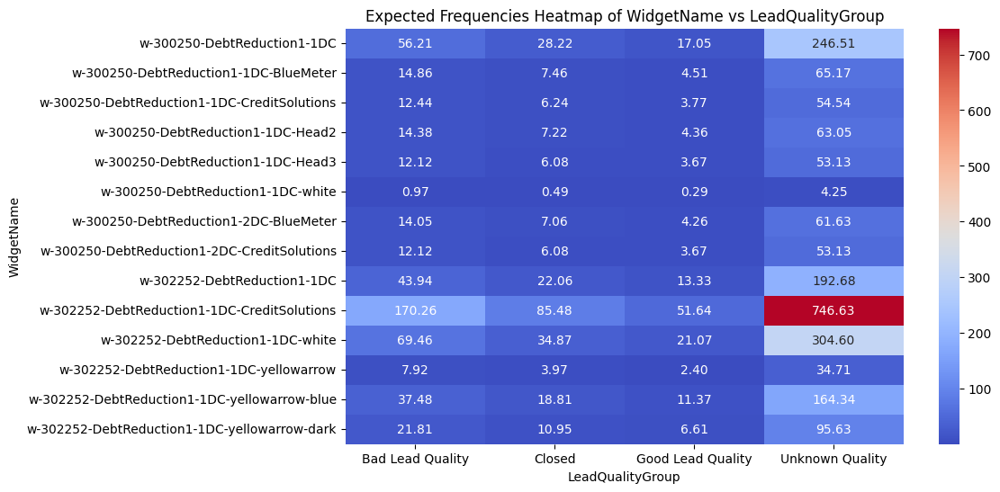

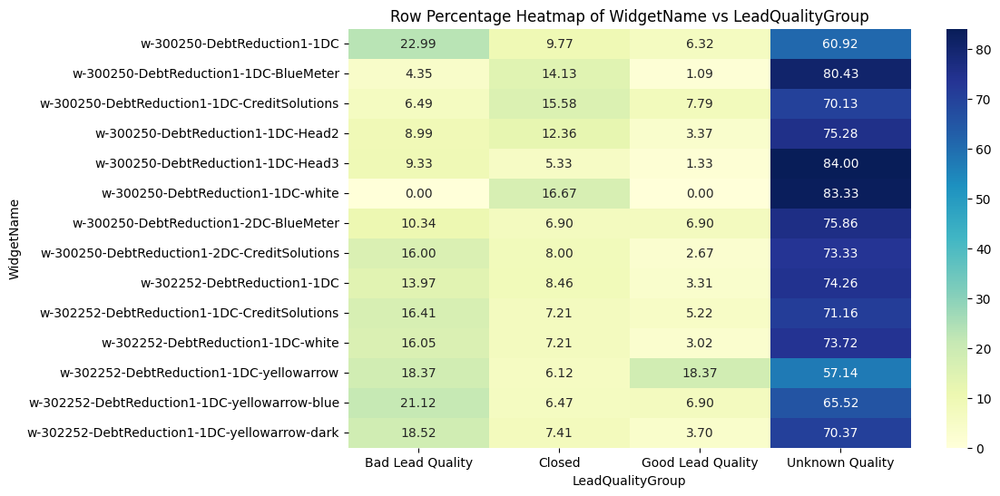

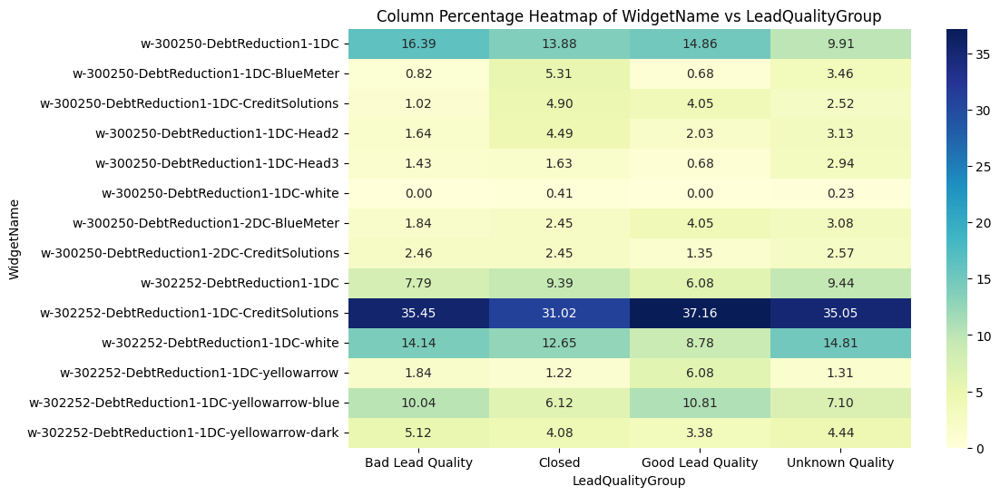


Chi-Square Test Results for WidgetName vs LeadQualityGroup:
Chi-Square Statistic: 98.42601161222358
Degrees of Freedom: 39
P-value: 4.8388301964564e-07

The association between WidgetName and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: PublisherZoneName

Value Counts for PublisherZoneName:
PublisherZoneName
TopLeft-302252       2750
Top Right-300x250     271
Name: count, dtype: int64


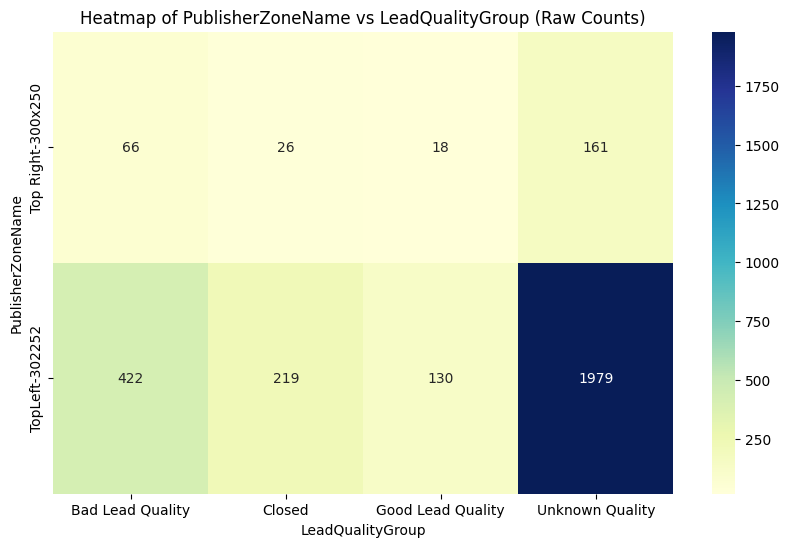

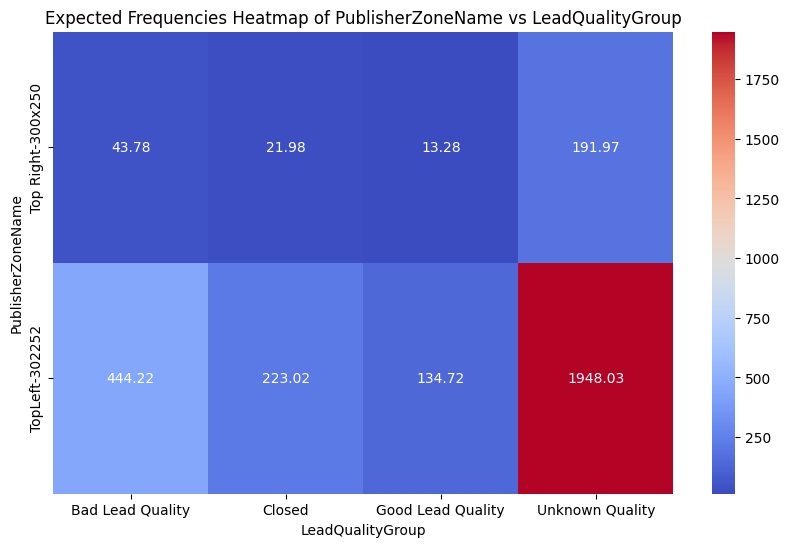

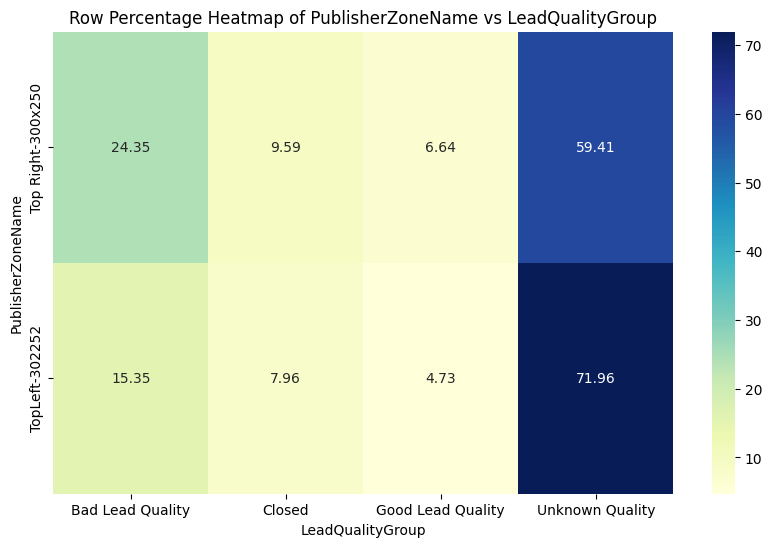

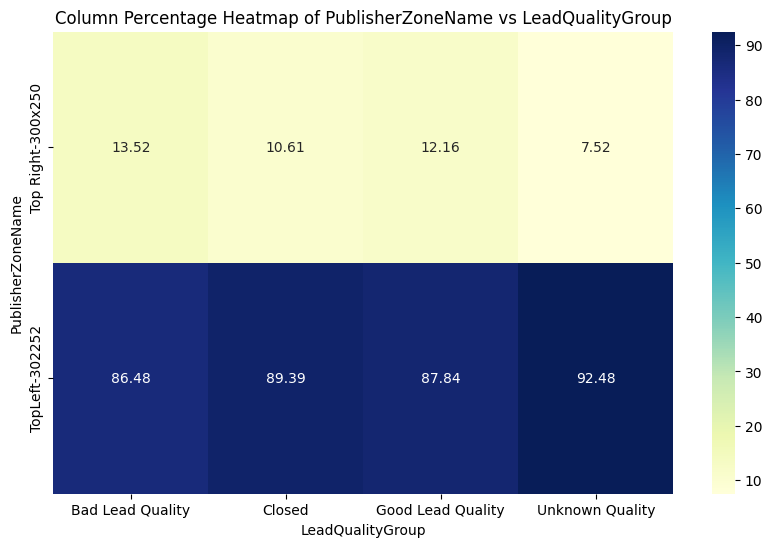


Chi-Square Test Results for PublisherZoneName vs LeadQualityGroup:
Chi-Square Statistic: 20.53748637582693
Degrees of Freedom: 3
P-value: 0.00013132190197640228

The association between PublisherZoneName and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: PublisherCampaignName

Value Counts for PublisherCampaignName:
PublisherCampaignName
DebtReductionInc           2750
DebtReductionCallCenter     271
Name: count, dtype: int64


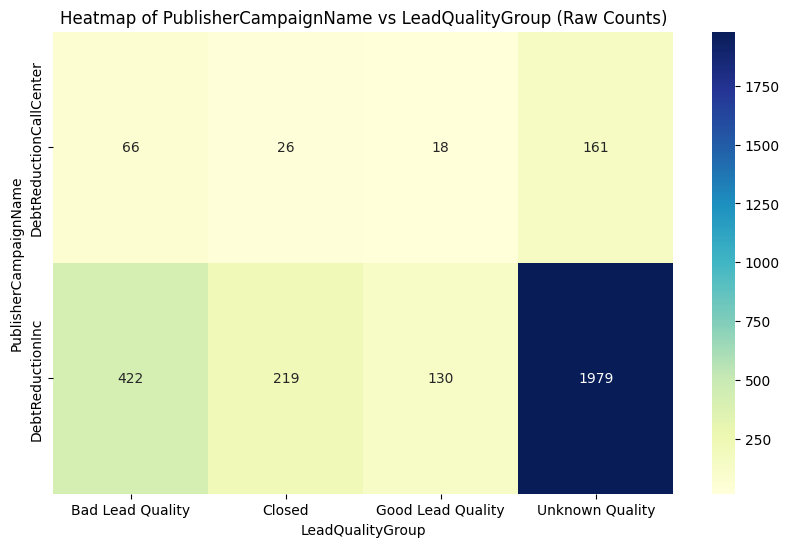

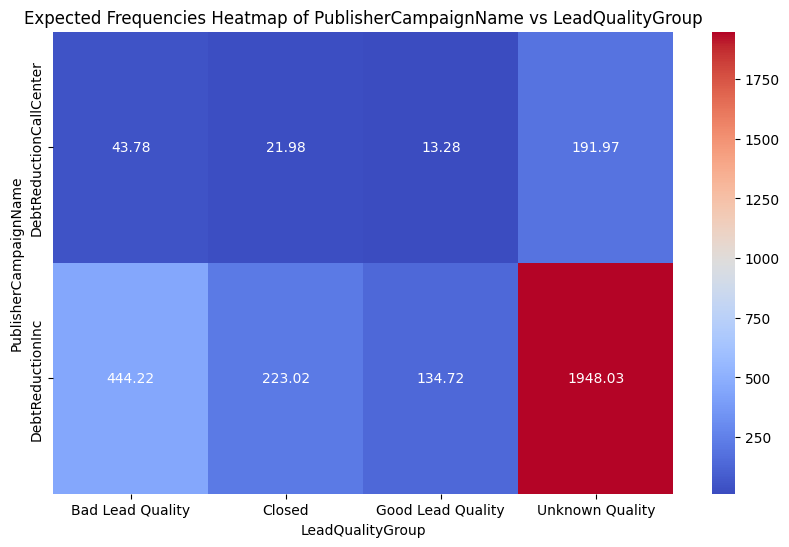

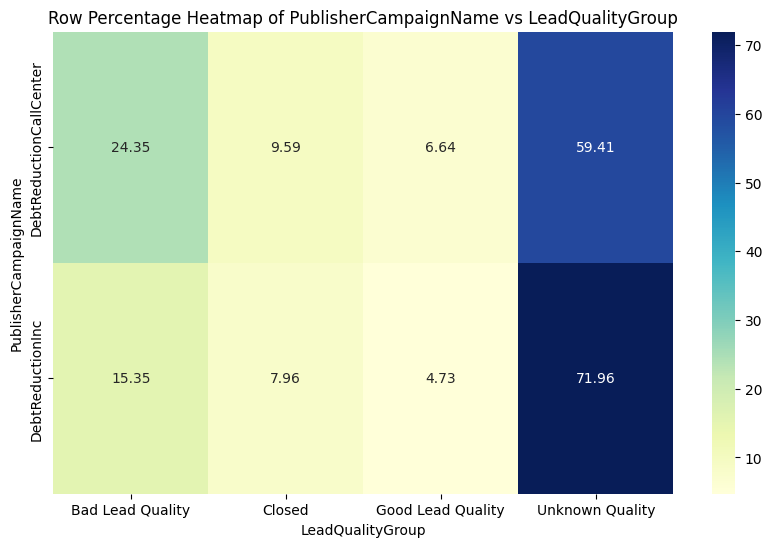

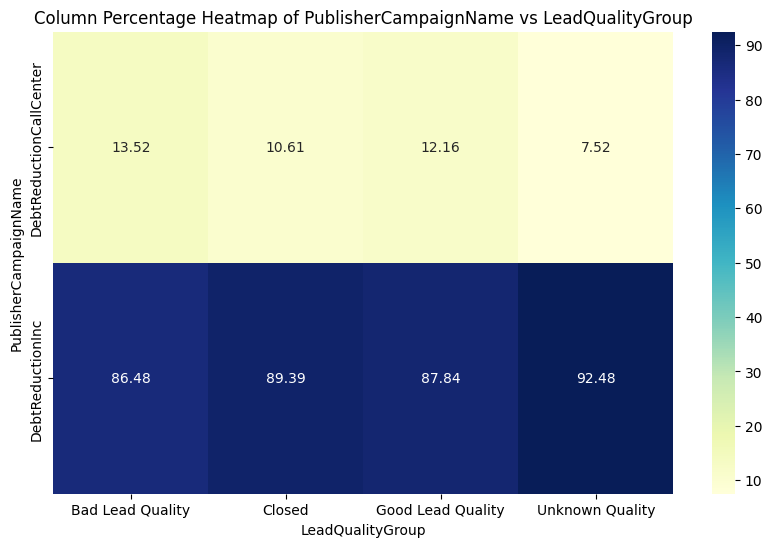


Chi-Square Test Results for PublisherCampaignName vs LeadQualityGroup:
Chi-Square Statistic: 20.53748637582693
Degrees of Freedom: 3
P-value: 0.00013132190197640228

The association between PublisherCampaignName and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: AddressScore

Value Counts for AddressScore:
AddressScore
5.0    870
1.0    122
3.0     93
4.0     48
2.0     38
Name: count, dtype: int64


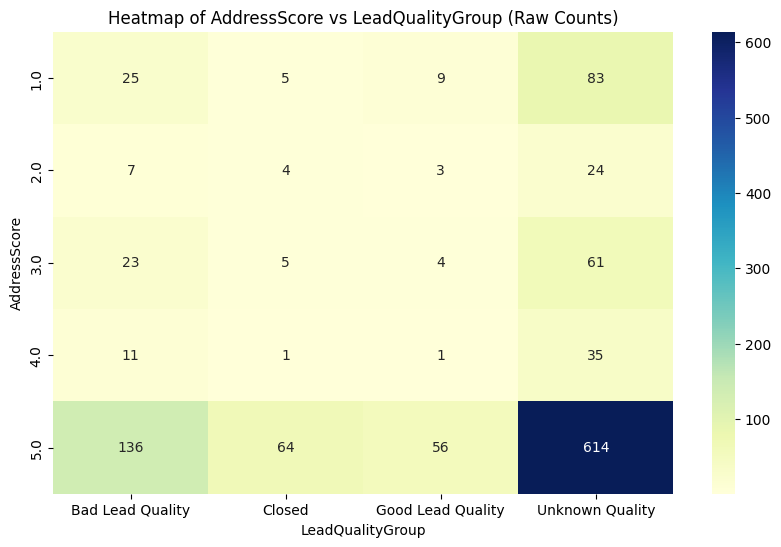

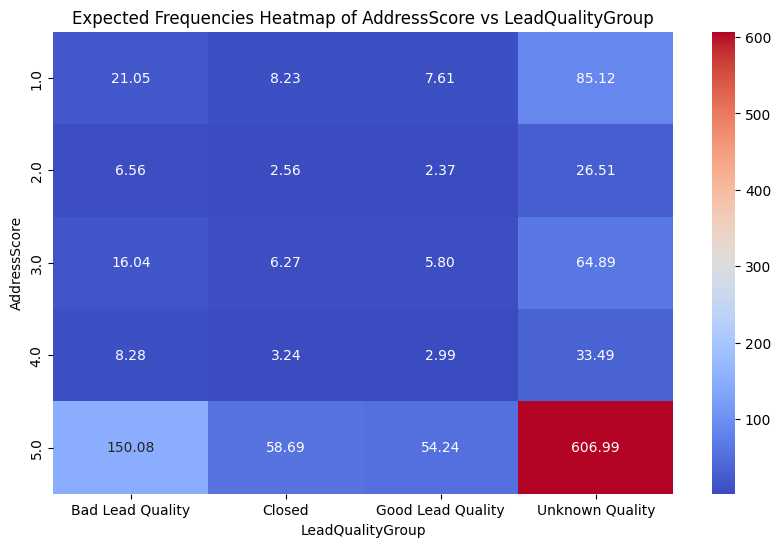

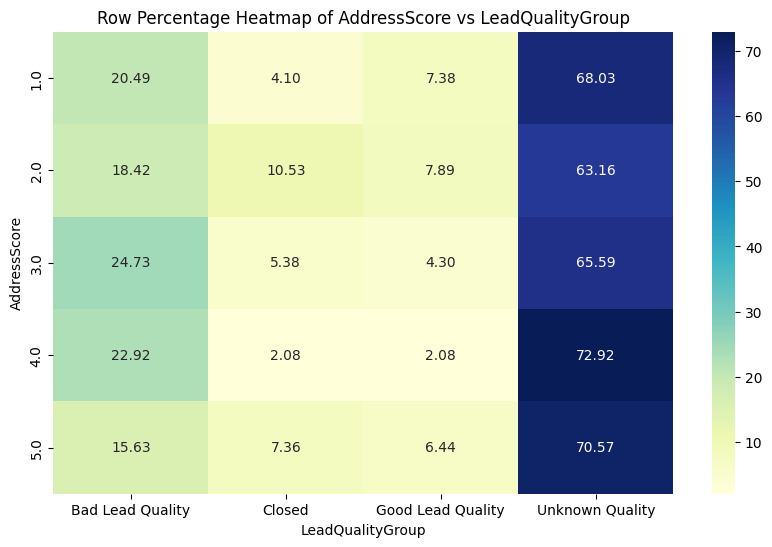

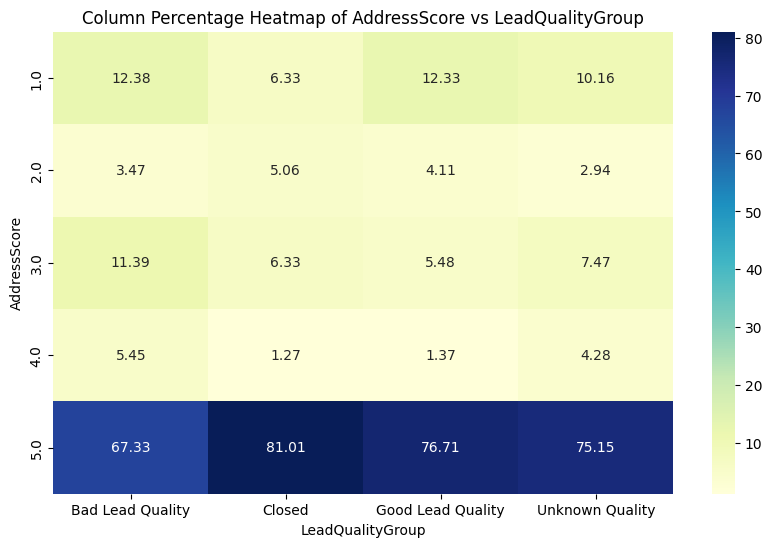


Chi-Square Test Results for AddressScore vs LeadQualityGroup:
Chi-Square Statistic: 13.400385278541098
Degrees of Freedom: 12
P-value: 0.34062277059988627

The association between AddressScore and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: PhoneScore

Value Counts for PhoneScore:
PhoneScore
5.0    619
3.0    427
4.0    184
2.0    162
1.0      1
Name: count, dtype: int64


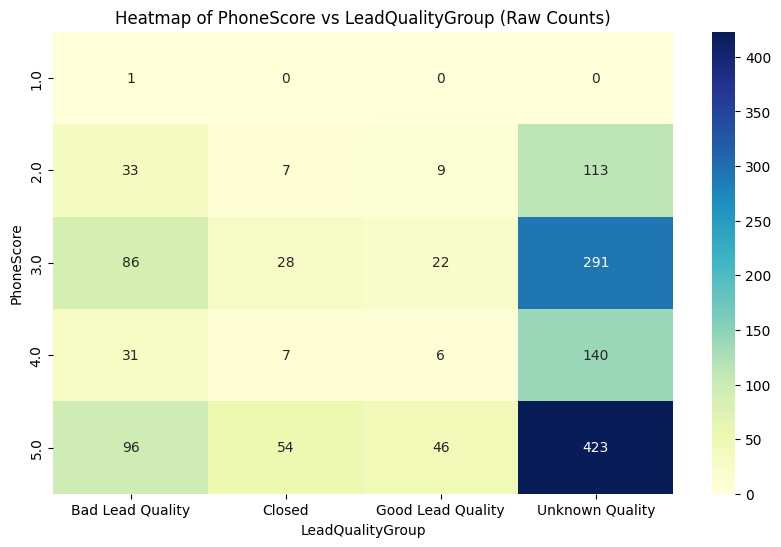

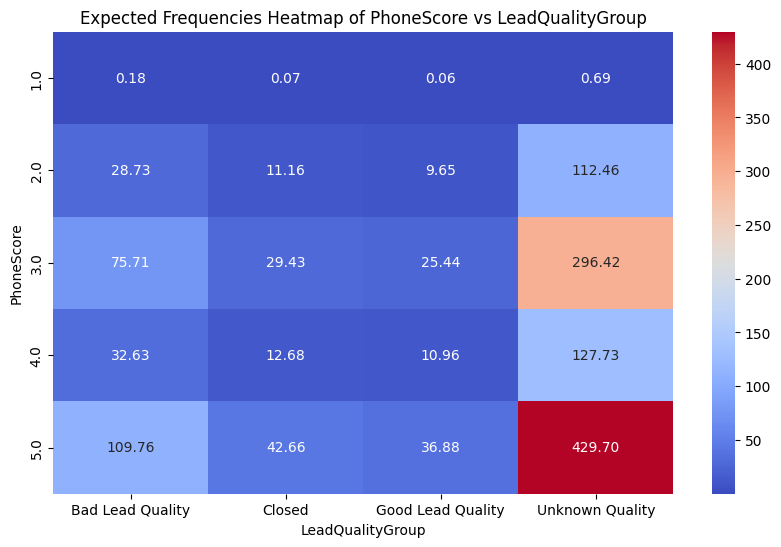

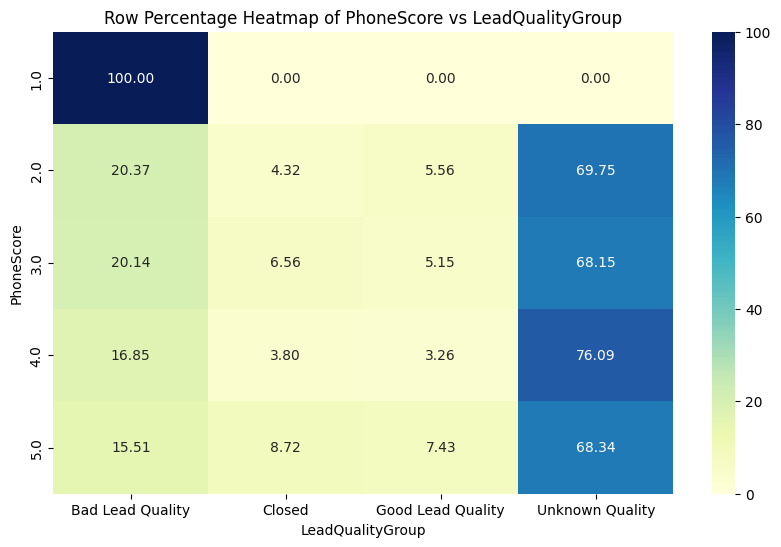

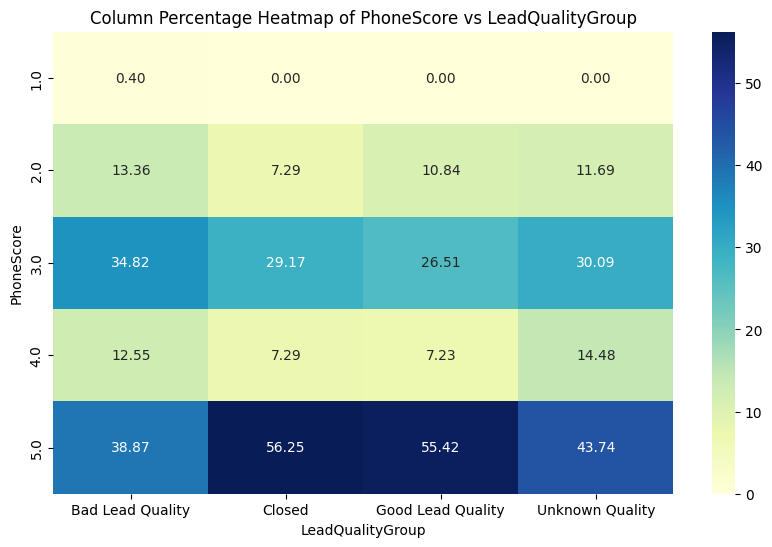


Chi-Square Test Results for PhoneScore vs LeadQualityGroup:
Chi-Square Statistic: 22.05696326599686
Degrees of Freedom: 12
P-value: 0.036886329239877655

The association between PhoneScore and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: AdvertiserCampaignName

Value Counts for AdvertiserCampaignName:
AdvertiserCampaignName
Debt Settlement1 Master              1815
creditsolutions-branded-shortform    1206
Name: count, dtype: int64


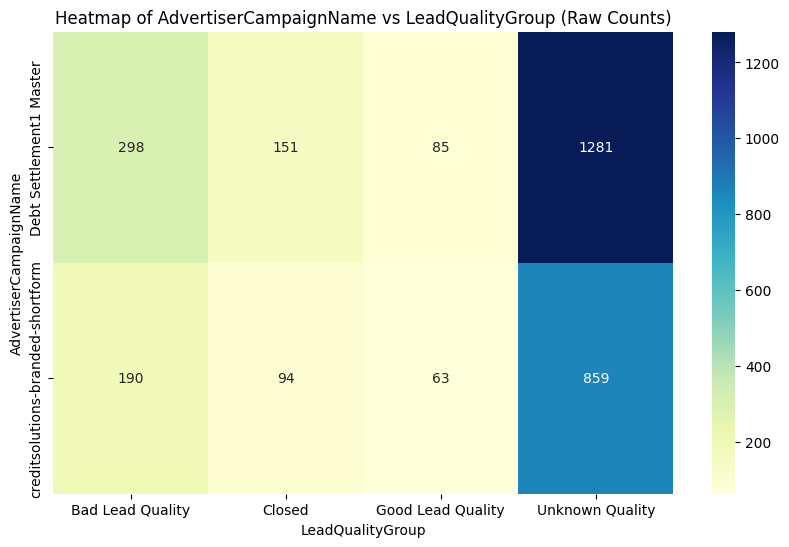

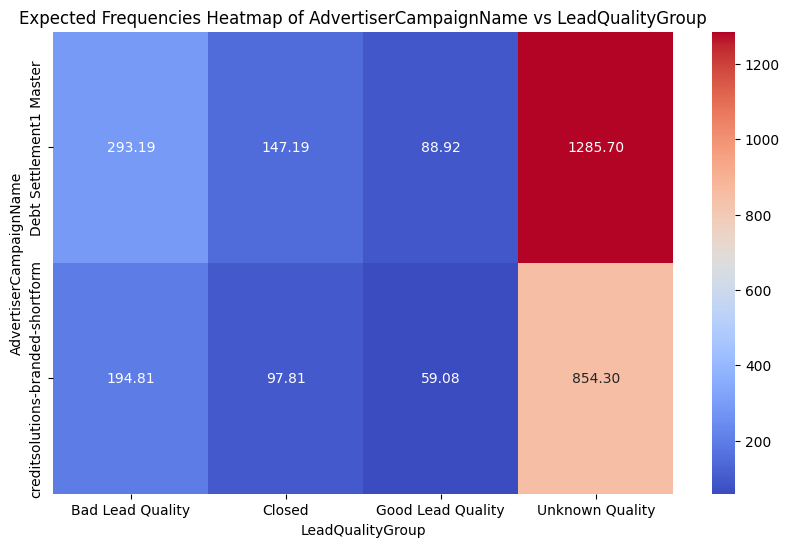

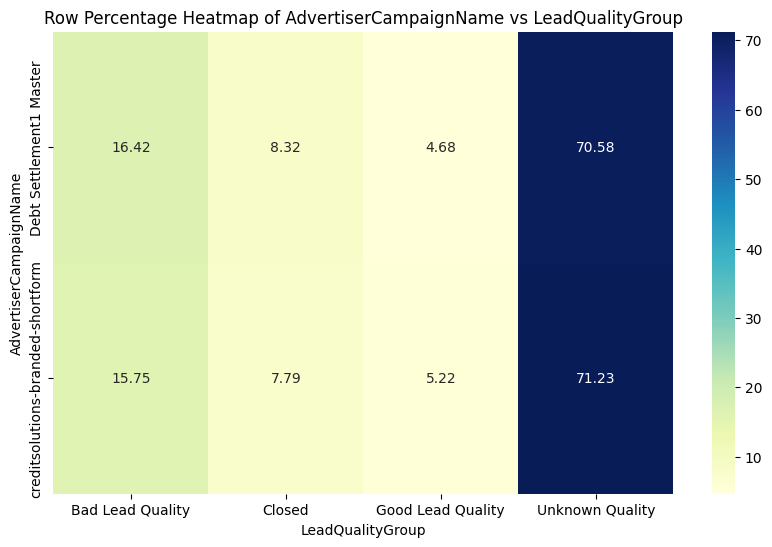

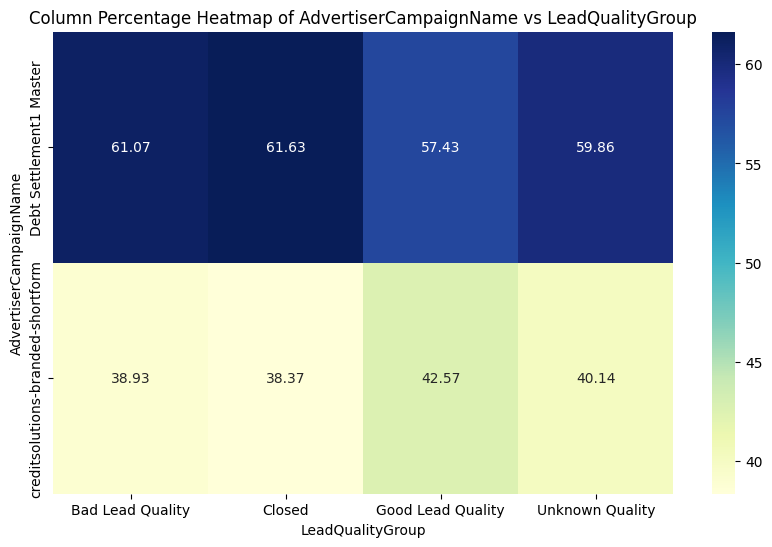


Chi-Square Test Results for AdvertiserCampaignName vs LeadQualityGroup:
Chi-Square Statistic: 0.9197049603064158
Degrees of Freedom: 3
P-value: 0.8206701322050193

The association between AdvertiserCampaignName and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: State

Value Counts for State:
State
CA    463
TX    325
NY    283
FL    261
IL    186
VA    145
MI    145
CO    105
MD     98
AL     96
AZ     94
MO     90
LA     80
PA     75
MA     70
NV     54
OR     54
WV     52
OK     50
AR     48
IN     36
HI     32
NM     29
WA     28
MT     24
CT     23
NE     22
IA     19
SD     11
ND      9
AK      8
DC      6
Name: count, dtype: int64


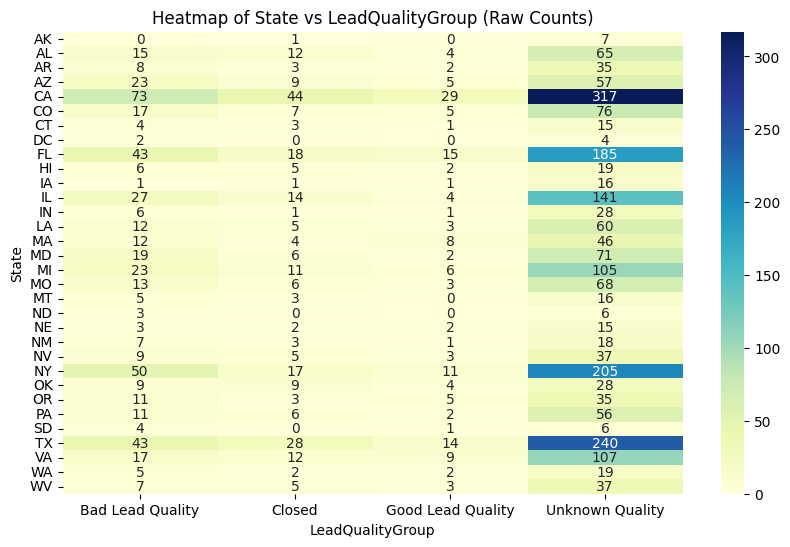

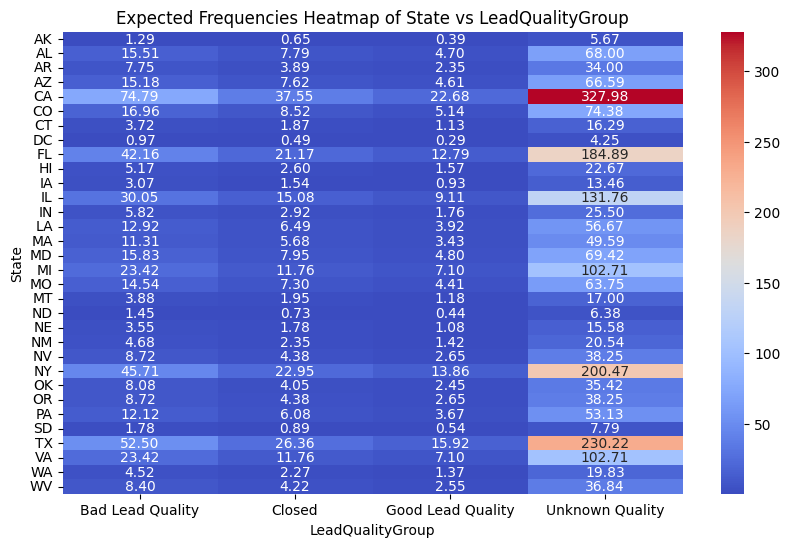

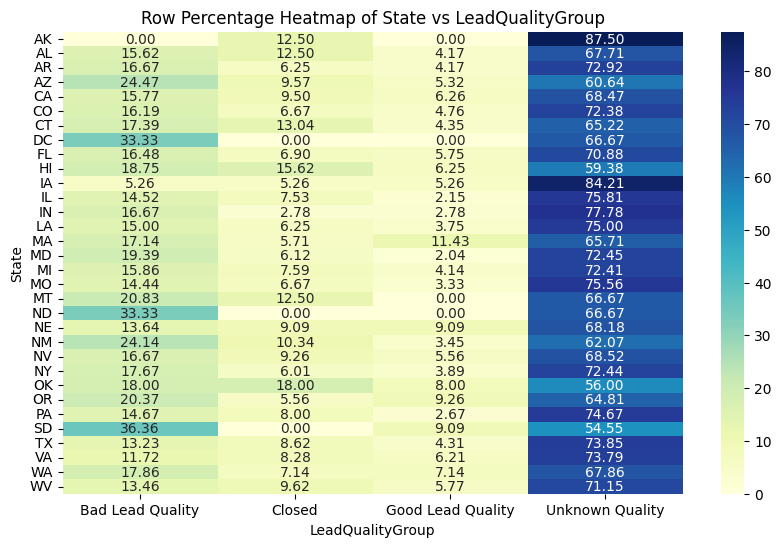

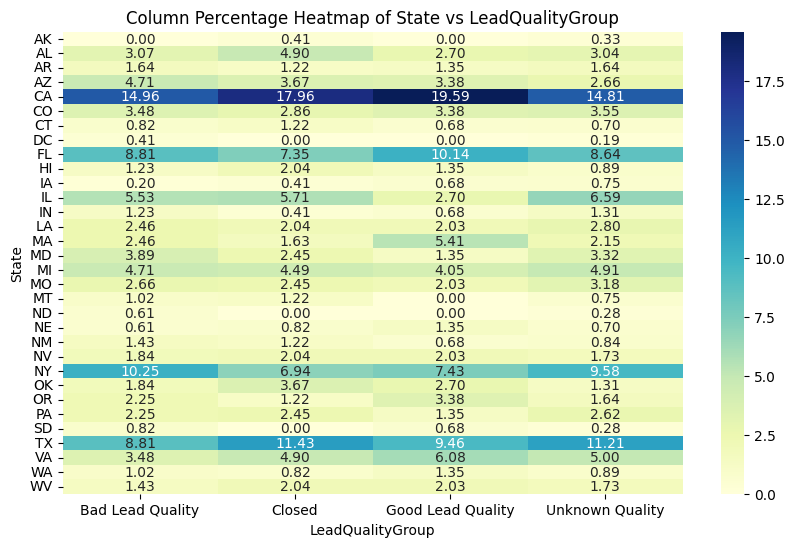


Chi-Square Test Results for State vs LeadQualityGroup:
Chi-Square Statistic: 74.50868915890919
Degrees of Freedom: 93
P-value: 0.9204437642617259

The association between State and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: DebtLevel

Value Counts for DebtLevel:
DebtLevel
30001-50000         496
20001-30000         456
7500-10000          442
15001-20000         408
10001-15000         291
7500-15000          271
50001-70000         245
More_than_100000    191
70001-90000         131
90000-100000         90
Name: count, dtype: int64


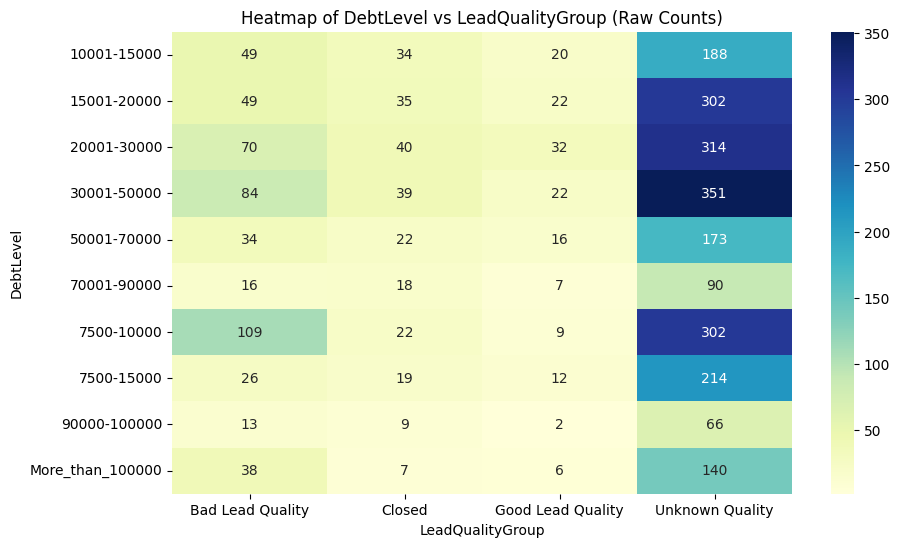

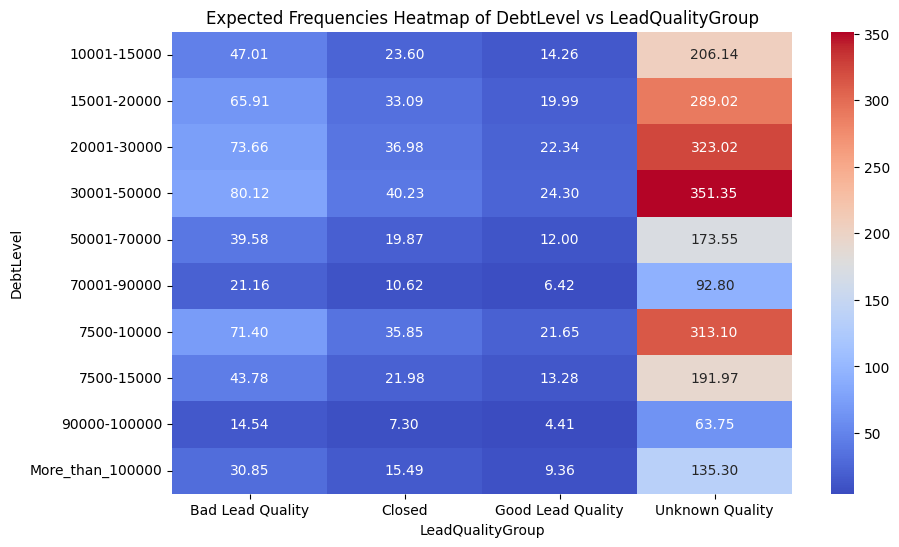

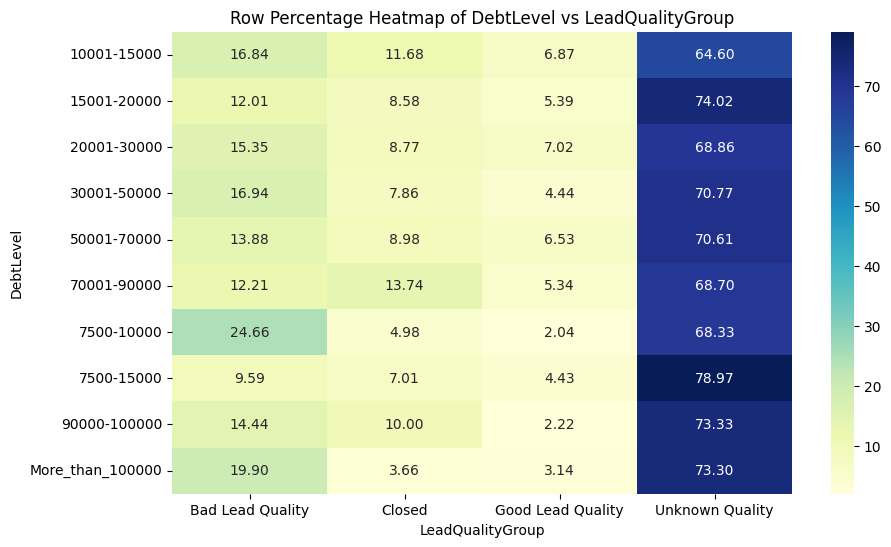

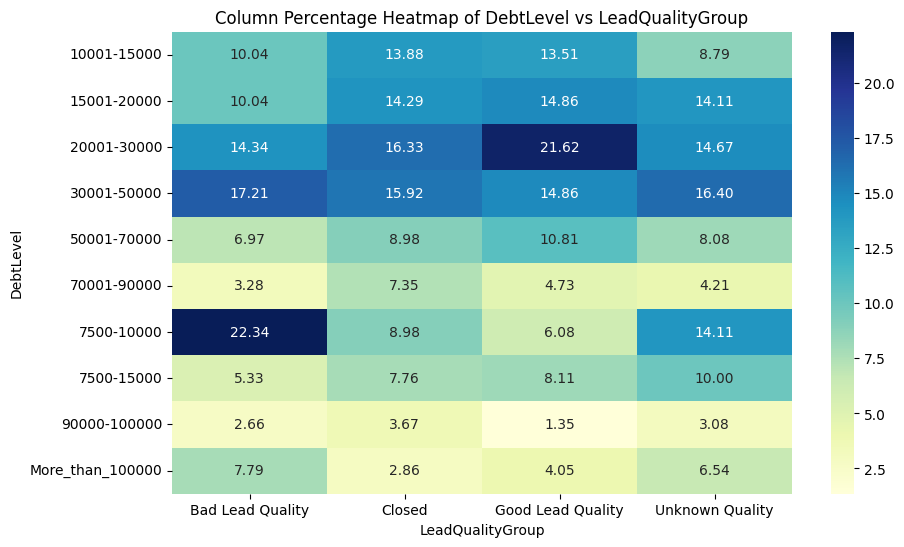


Chi-Square Test Results for DebtLevel vs LeadQualityGroup:
Chi-Square Statistic: 80.8177607704948
Degrees of Freedom: 27
P-value: 2.837255867012823e-07

The association between DebtLevel and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: Partner

Value Counts for Partner:
Partner
google           979
yahoo            958
Google           639
Call_Center      271
AdKnowledge      171
Advertise.com      3
Name: count, dtype: int64


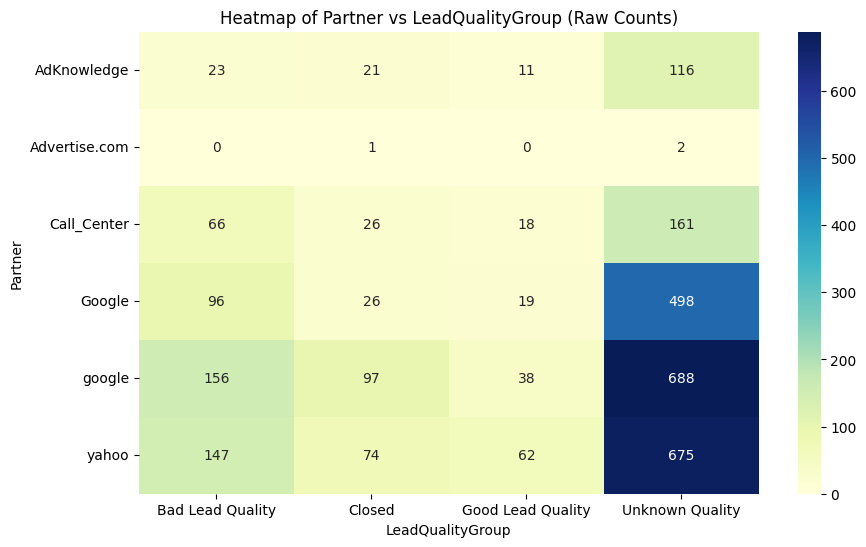

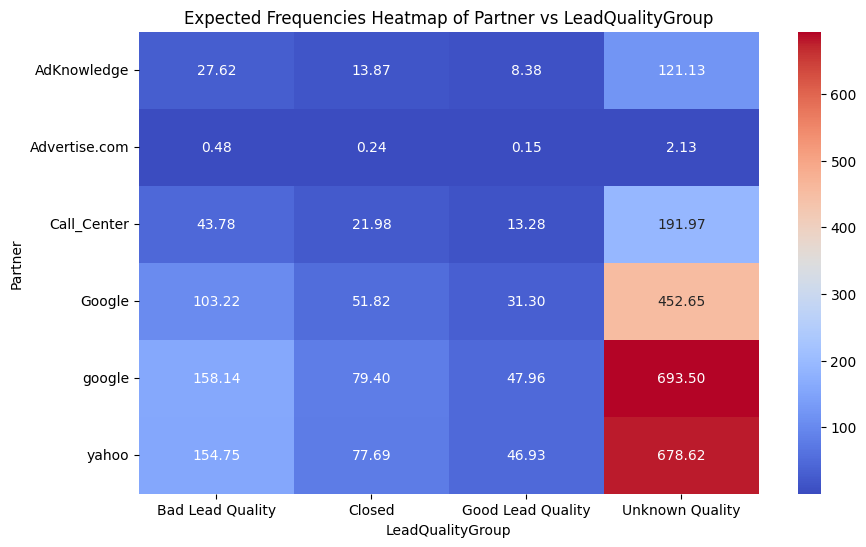

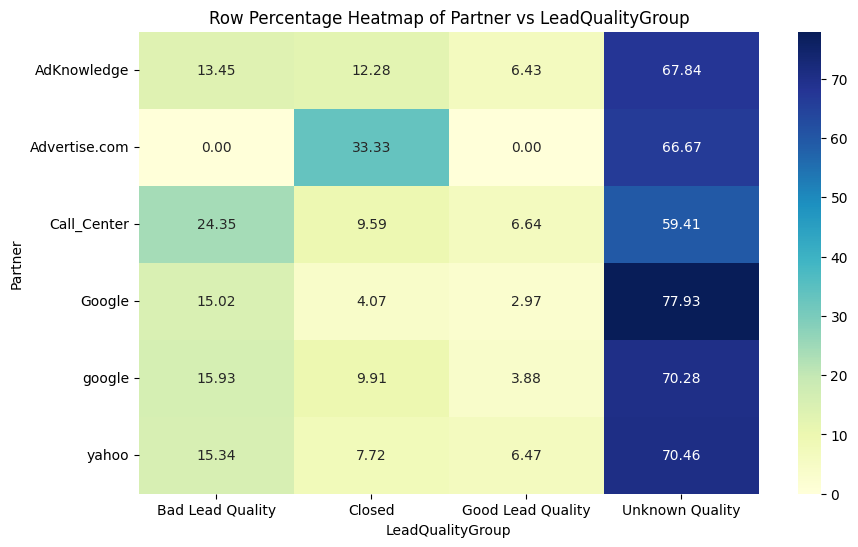

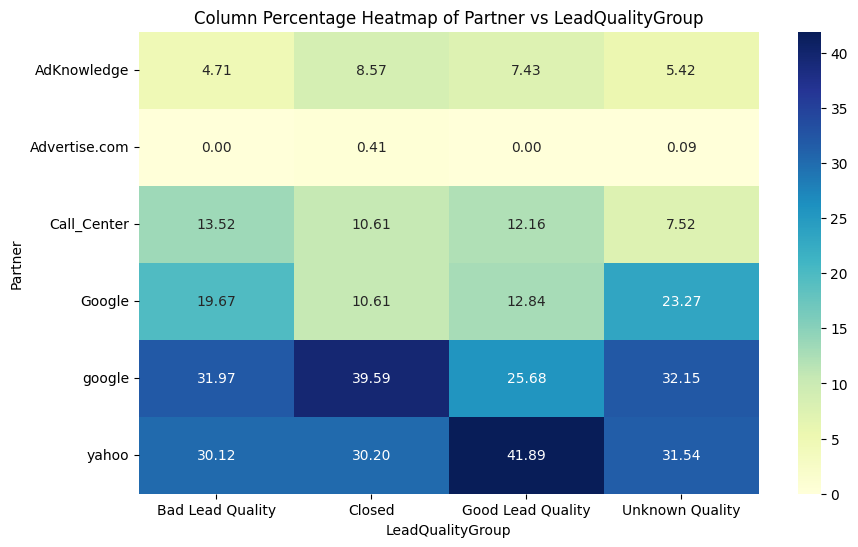


Chi-Square Test Results for Partner vs LeadQualityGroup:
Chi-Square Statistic: 61.384730105843886
Degrees of Freedom: 15
P-value: 1.4555368936805846e-07

The association between Partner and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: ReferralDomain

Value Counts for ReferralDomain:
ReferralDomain
search.yahoo.com               573
www.google.com                 491
googleads.g.doubleclick.net    290
ezinearticles.com              101
www.ehow.com                    69
                              ... 
hostghostplus.com                1
bl102w.blu102.mail.live.com      1
sz0029.wc.mail.comcast.net       1
www.virginia-discovered.com      1
us.mc536.mail.yahoo.com          1
Name: count, Length: 372, dtype: int64


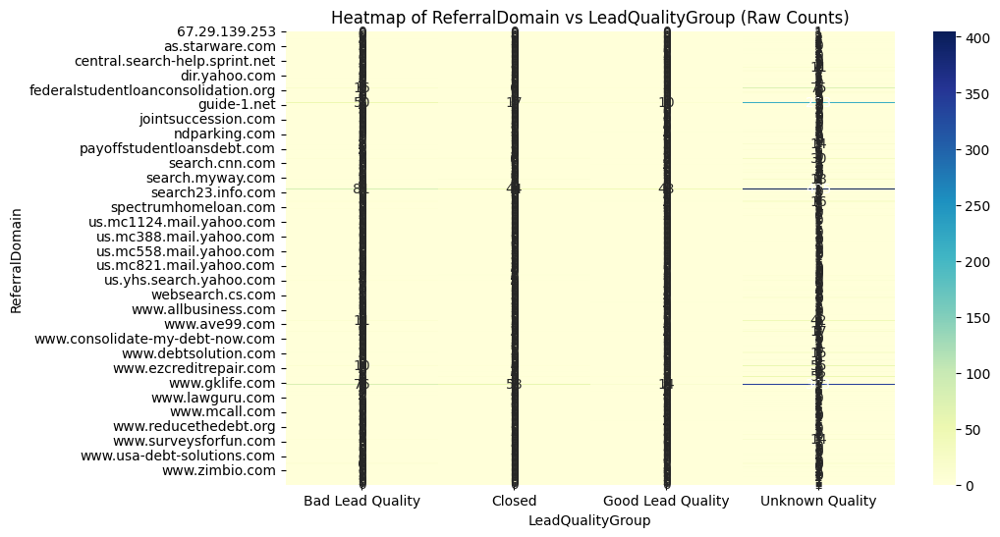

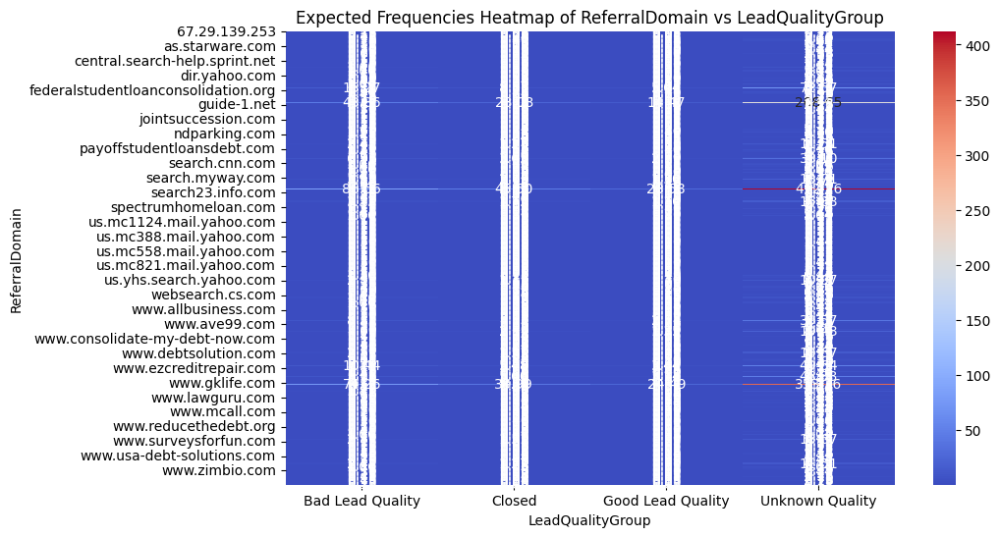

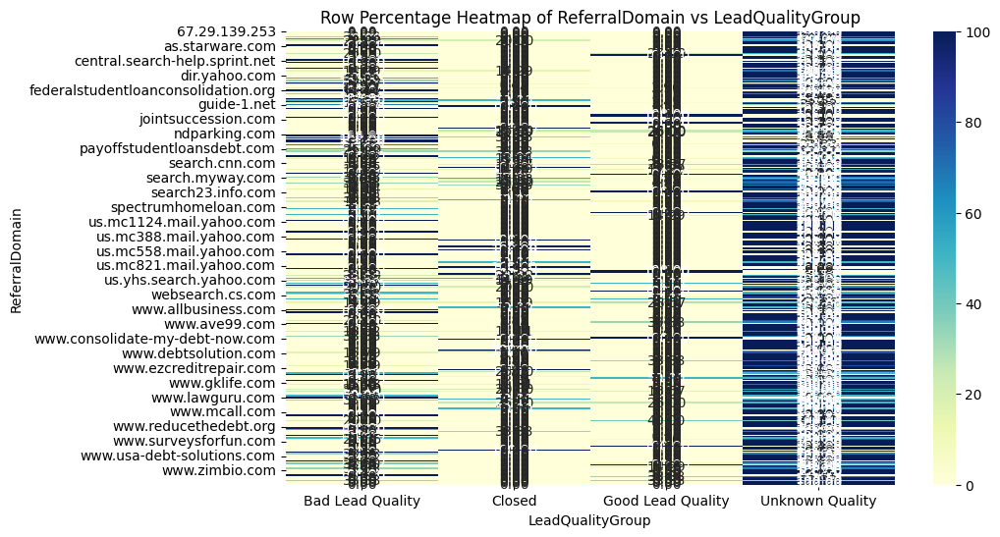

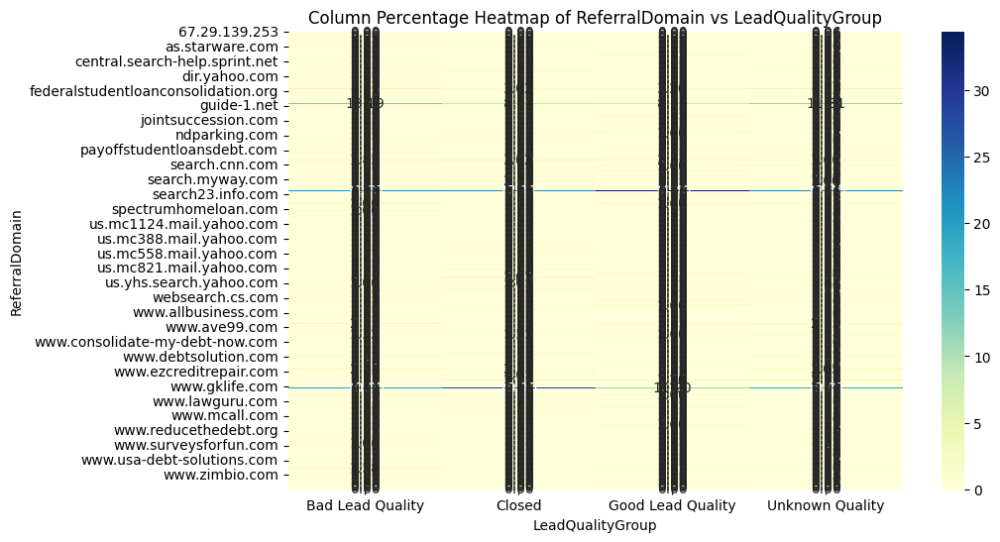


Chi-Square Test Results for ReferralDomain vs LeadQualityGroup:
Chi-Square Statistic: 1110.9773064336741
Degrees of Freedom: 1113
P-value: 0.511473793550916

The association between ReferralDomain and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: MarketingCampaign

Value Counts for MarketingCampaign:
MarketingCampaign
DebtReductionInc                                 1473
Debt Holding Tank                                 338
Debt General                                      329
Financial Services                                171
Debt Volume                                       143
Credit                                            100
state                                              97
Debt Consolidation                                 34
DebtReductionInc - YSM Restructure (05/29/09)      23
Debt Volume_CA                                     12
Debt Volume_TX                                      7
Debt Volume_MI                                   

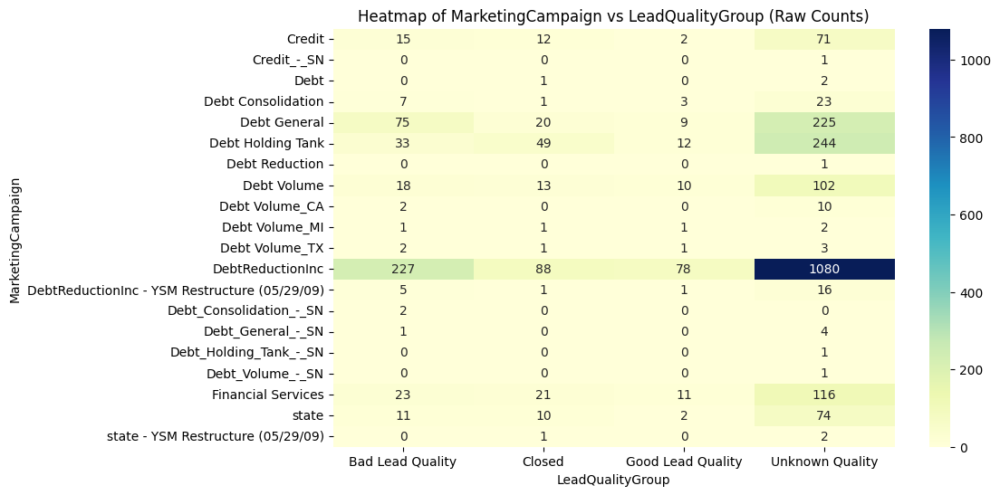

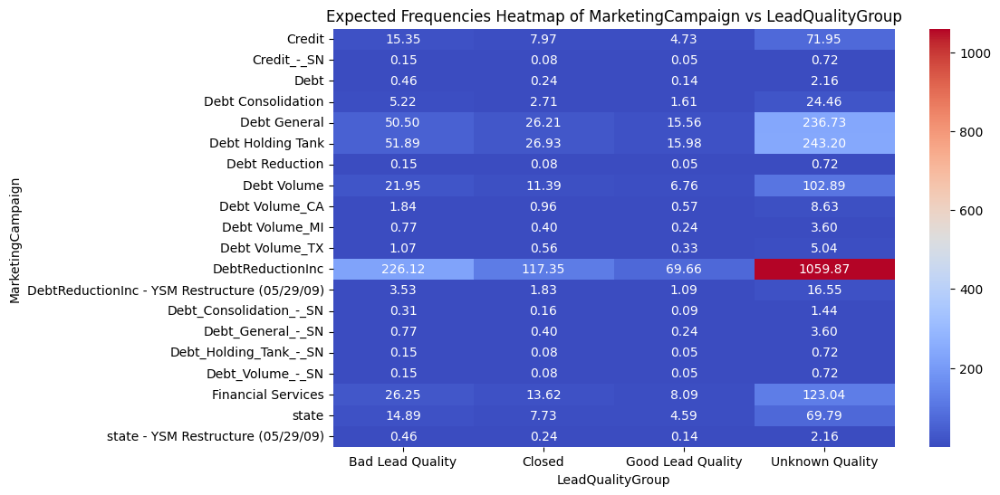

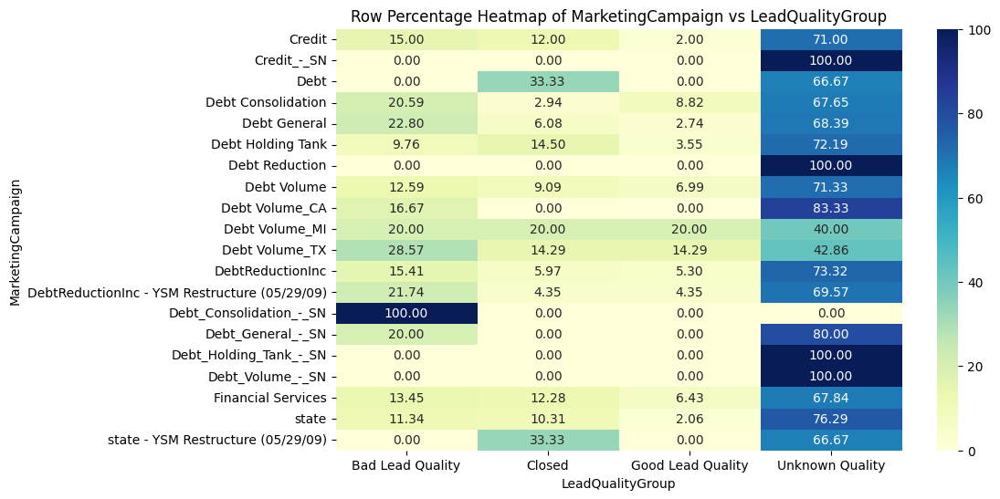

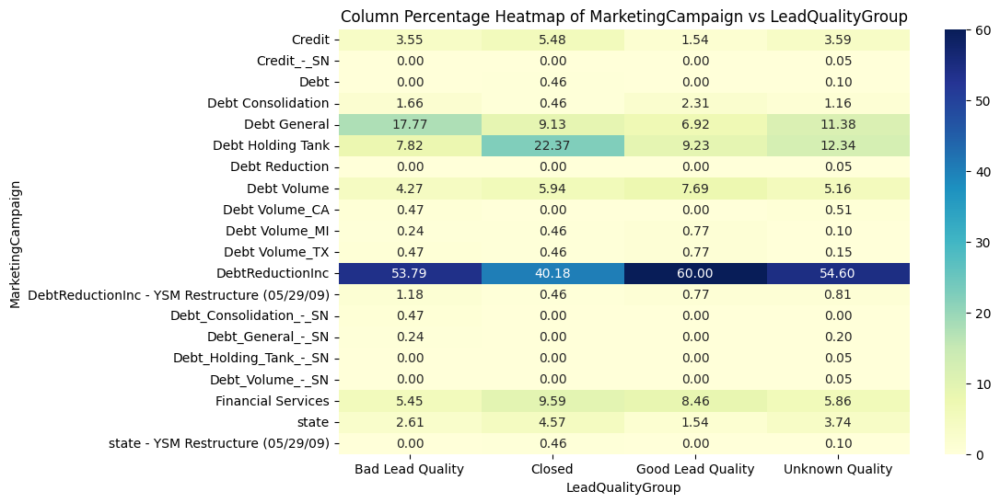


Chi-Square Test Results for MarketingCampaign vs LeadQualityGroup:
Chi-Square Statistic: 99.40248299486615
Degrees of Freedom: 57
P-value: 0.00043282943286880035

The association between MarketingCampaign and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: AdGroup

Value Counts for AdGroup:
AdGroup
Student Debt                      360
Holding Tank - Debt               338
Credit Card Debt - high volume    258
Lower Payments                    197
Debt Consolidation                195
                                 ... 
Debt_Consolidate                    1
Unsecured Debt                      1
Debt_Services                       1
Credit_Debt_Consolidation           1
Debt_Consolidation                  1
Name: count, Length: 103, dtype: int64


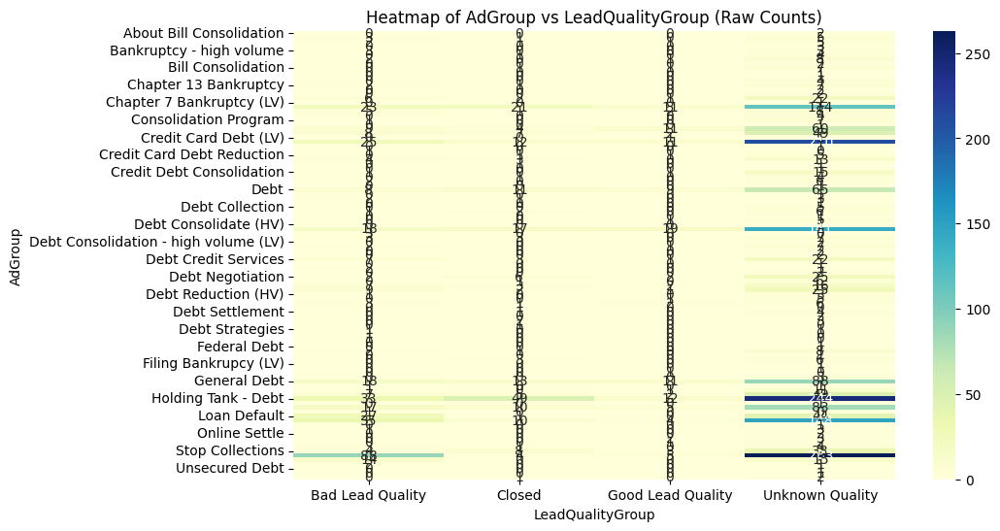

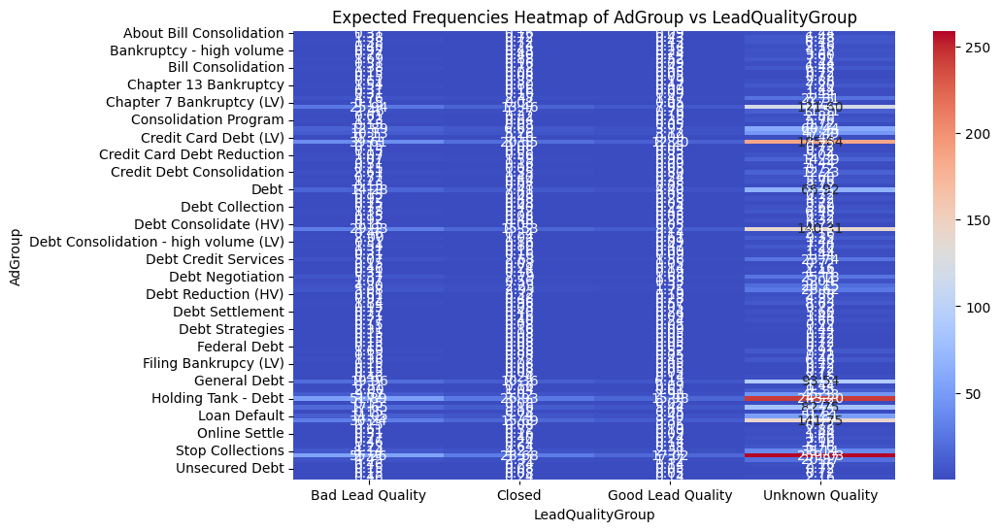

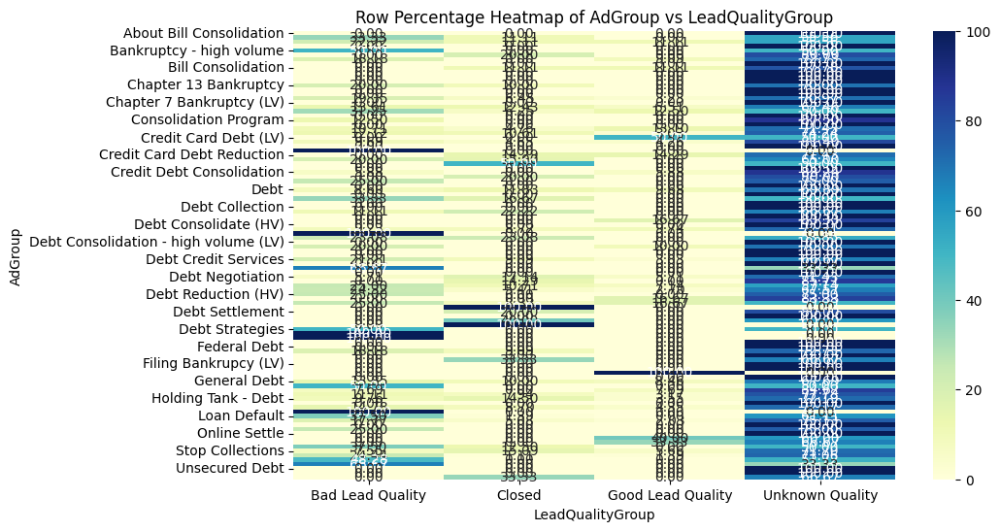

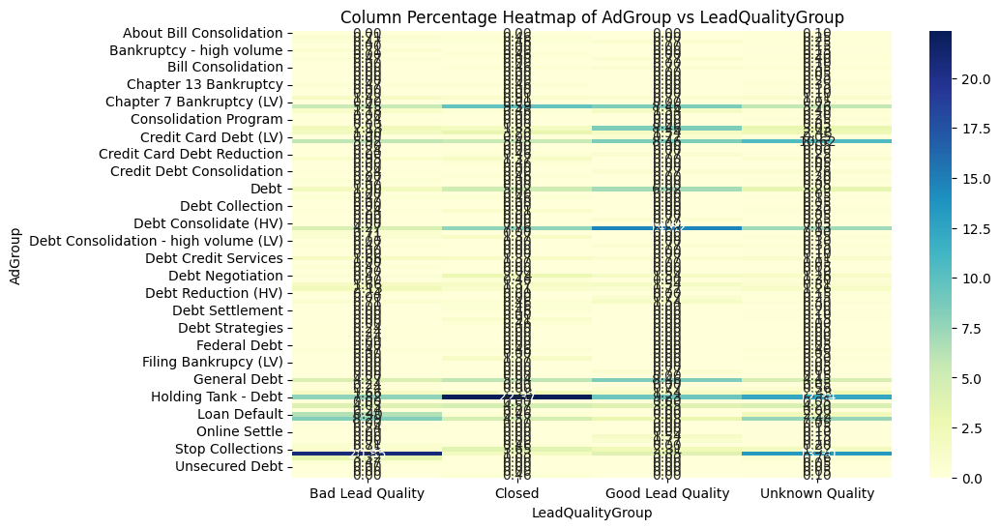


Chi-Square Test Results for AdGroup vs LeadQualityGroup:
Chi-Square Statistic: 470.33327547282084
Degrees of Freedom: 306
P-value: 4.388997204912013e-09

The association between AdGroup and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: Keyword

Value Counts for Keyword:
Keyword
Credit card payments          104
Debt                           92
debt                           65
Student loan default           51
Loan default help              44
                             ... 
Reducing student loan debt      1
Credit services co              1
Reliance debt relief            1
Free debt program               1
Debtfree com                    1
Name: count, Length: 285, dtype: int64


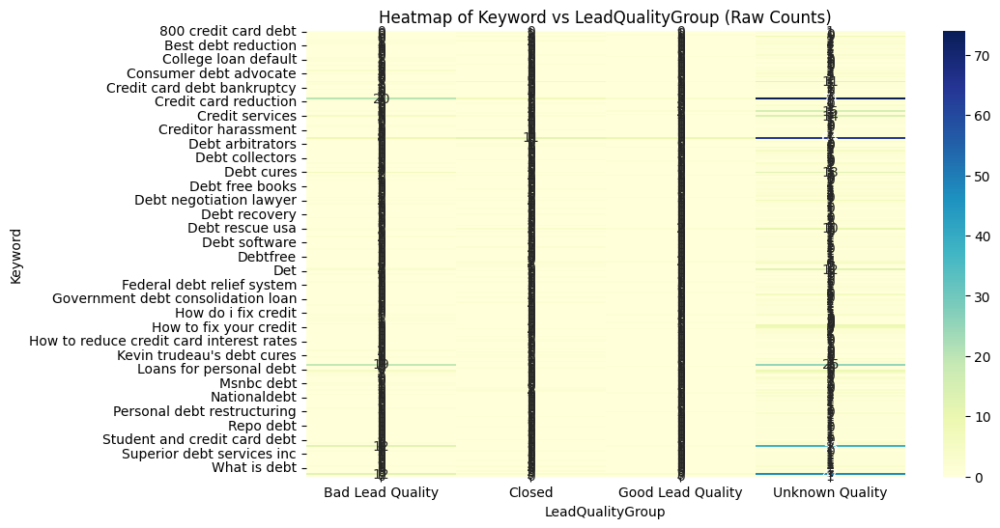

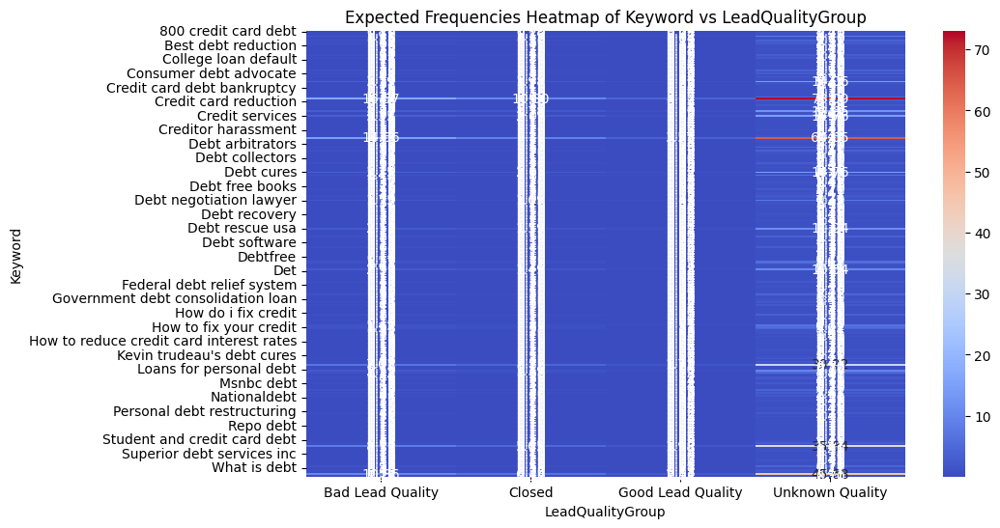

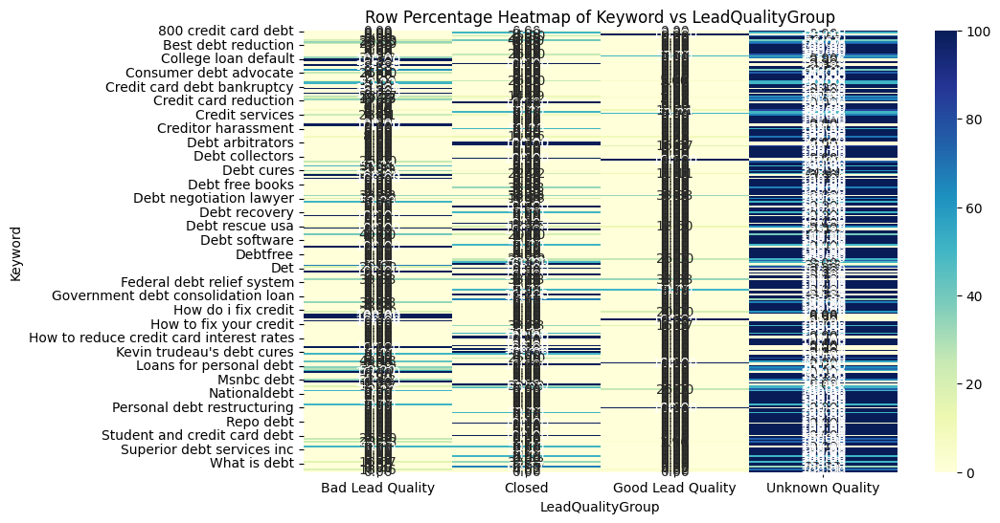

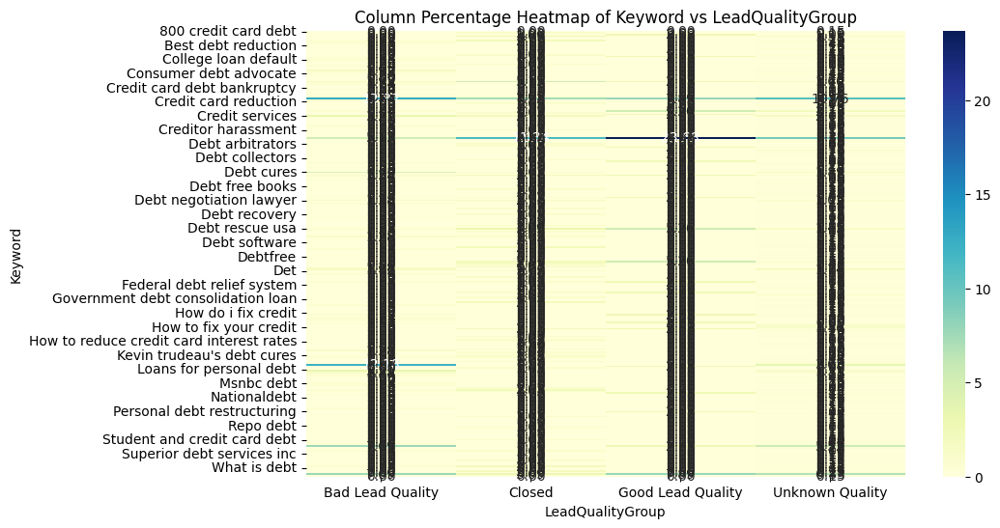


Chi-Square Test Results for Keyword vs LeadQualityGroup:
Chi-Square Statistic: 852.5884311671481
Degrees of Freedom: 852
P-value: 0.4878734057025957

The association between Keyword and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: ReferralURL

Value Counts for ReferralURL:
ReferralURL
http://www.google.com/search                                        453
http://search.yahoo.com/search                                      443
http://googleads.g.doubleclick.net/pagead/ads                       290
http://ezinearticles.com/                                            89
http://www.ask.com/web                                               55
                                                                   ... 
http://www.blogcatalog.com/topic/do it yourself debt settlement/      1
http://search.yahoo.com/search;_ylt=A0geu65BB6hKyIUAyWpXNyoA          1
http://search.yahoo.com/search;_ylt=A0geut_f9adK78MA0VlXNyoA          1
http://int.ask.com/web      

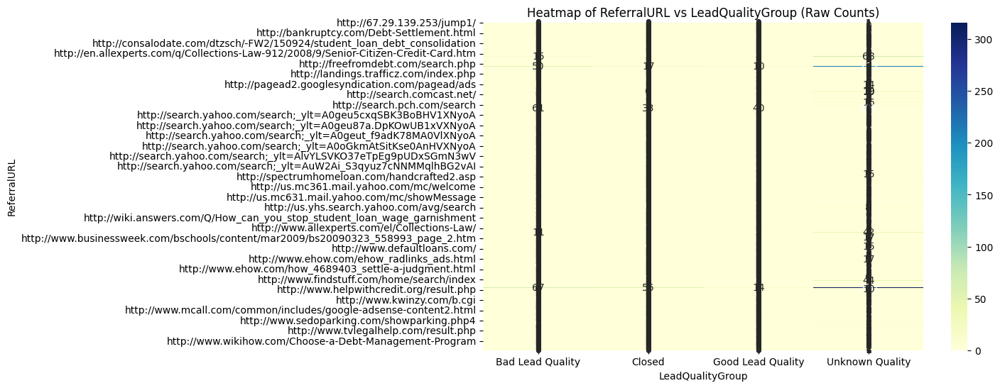

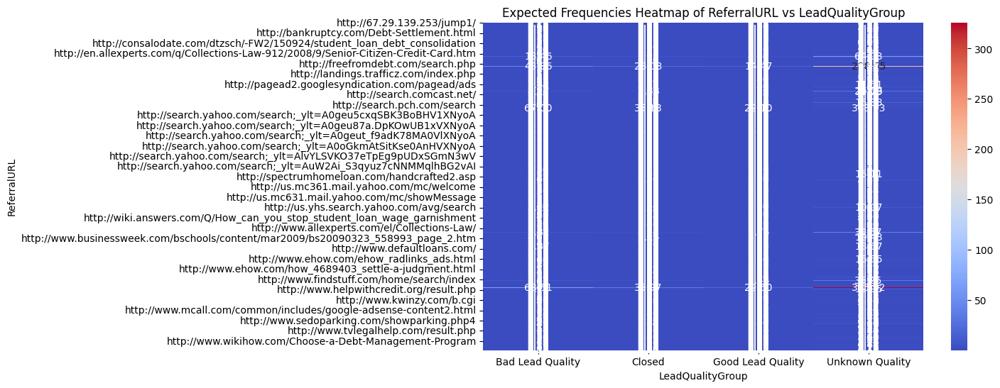

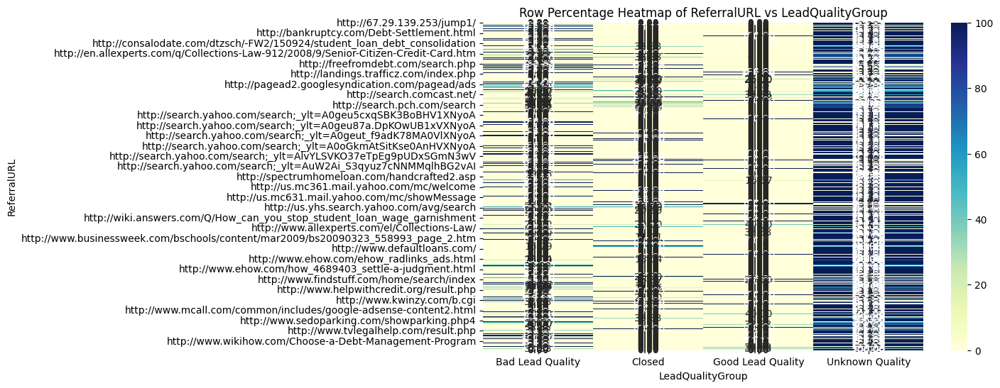

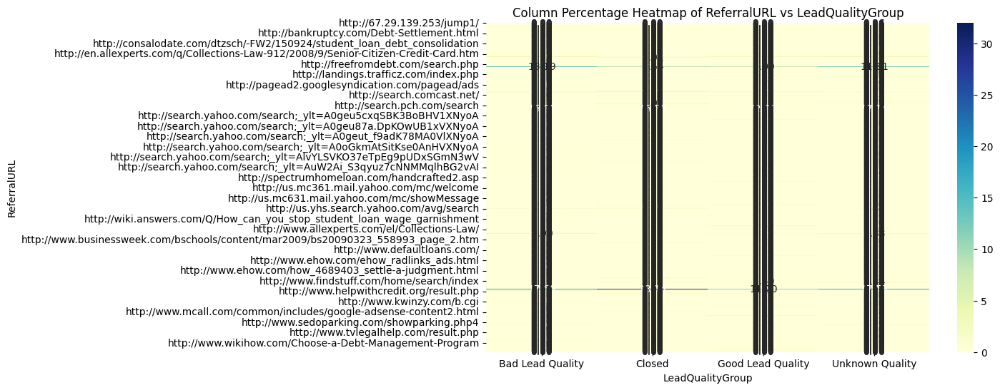


Chi-Square Test Results for ReferralURL vs LeadQualityGroup:
Chi-Square Statistic: 1939.9959110274422
Degrees of Freedom: 2007
P-value: 0.855206936303221

The association between ReferralURL and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: ReferralURL Parameters

Value Counts for ReferralURL Parameters:
ReferralURL Parameters
_IceUrl=true                                                                                                                                19
utm_source=Google&utm_medium=cpc&utm_campaign=DebtReductionInc&utm_content=Student%20Debt&keyword=Defaulted%20Student%20Loan%20Solutions    11
p=hl&as=yhoo&ac=1387                                                                                                                         9
ref=fuel&utm_source=yahoo&utm_medium=ssp&utm_campaign=yssp_art                                                                               5
p=ways to get out of debt&cs=bz&sado=1                        

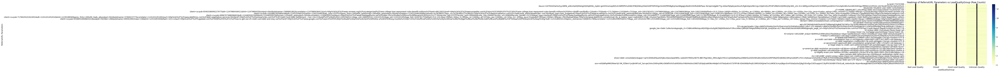

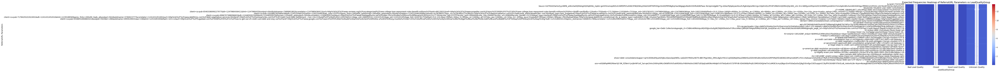

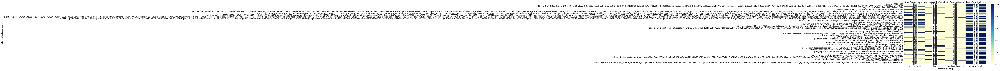

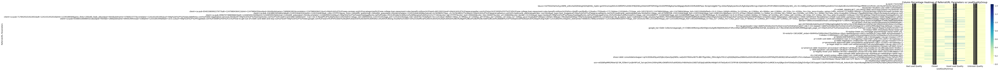


Chi-Square Test Results for ReferralURL Parameters vs LeadQualityGroup:
Chi-Square Statistic: 6632.988035688981
Degrees of Freedom: 6594
P-value: 0.36518355194523633

The association between ReferralURL Parameters and LeadQualityGroup is not statistically significant (p >= 0.05).

Analyzing Column: LandingPageURL

Value Counts for LandingPageURL:
LandingPageURL
http://www.debtreductioninc.com/index8.html                               2540
https://callcenter.inadcoads.com/callcenter/signius/CallCenterDRI.html     188
http://www.debtreductioninc.com/index12.html                               124
http://www.debtreductioninc.com/index11.html                                86
http://www.inadcoad.com/CallCenter/Signius/CallCenterDRI.html               83
Name: count, dtype: int64


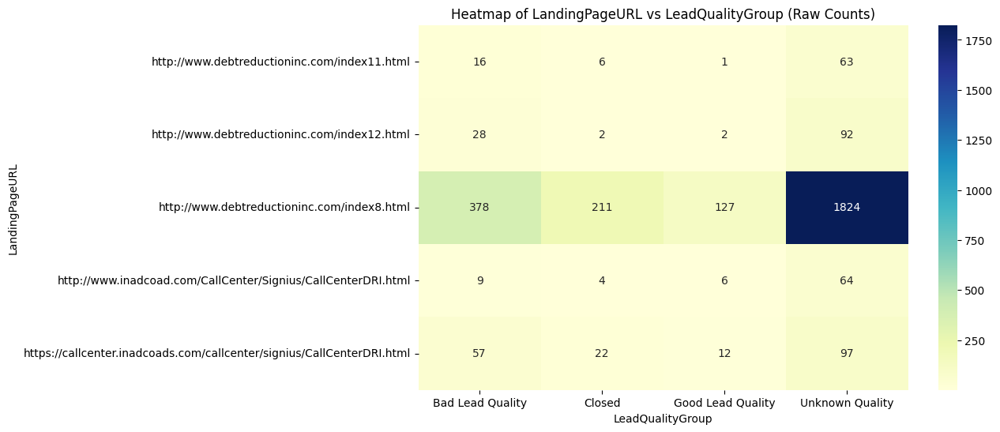

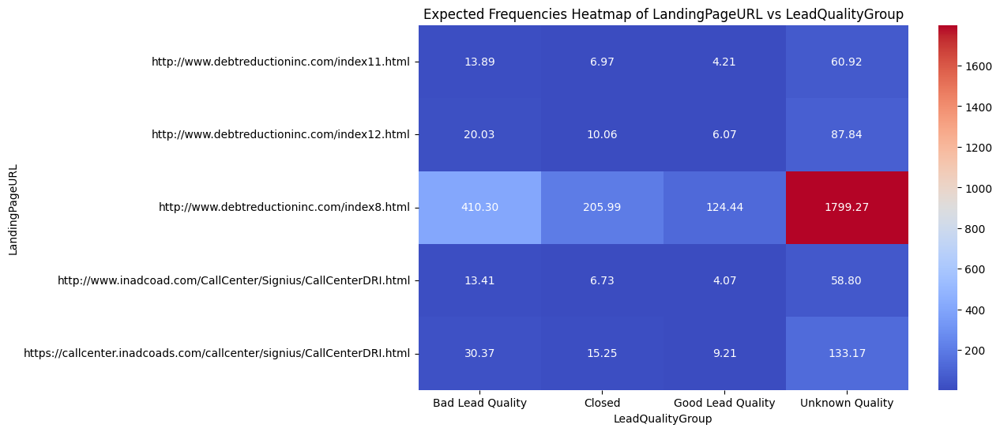

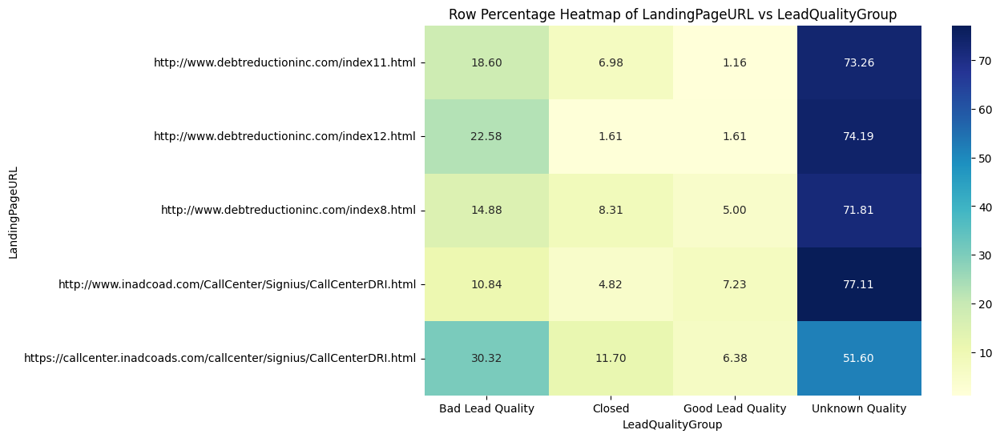

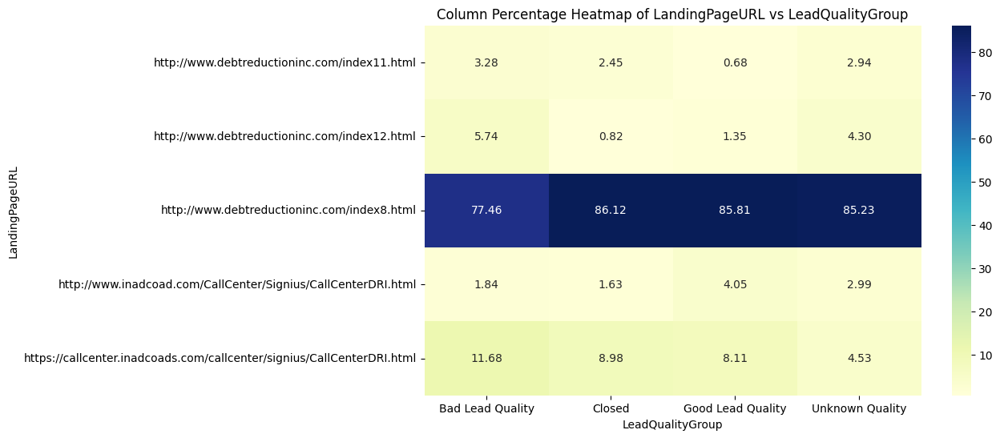


Chi-Square Test Results for LandingPageURL vs LeadQualityGroup:
Chi-Square Statistic: 59.54406967574071
Degrees of Freedom: 12
P-value: 2.733058001066009e-08

The association between LandingPageURL and LeadQualityGroup is statistically significant (p < 0.05).

Analyzing Column: Landing Page URL Parameters

Value Counts for Landing Page URL Parameters:
Landing Page URL Parameters
utm_source=Call_Center                                                                                                                                                                                                                                                          271
utm_source=Google&utm_medium=cpc&utm_campaign=DebtReductionInc&utm_content=Student%20Debt&keyword=Defaulted%20Student%20Loan%20Solutions                                                                                                                                        269
utm_source=Google&utm_medium=cpc&utm_campaign=DebtReductionInc&ut

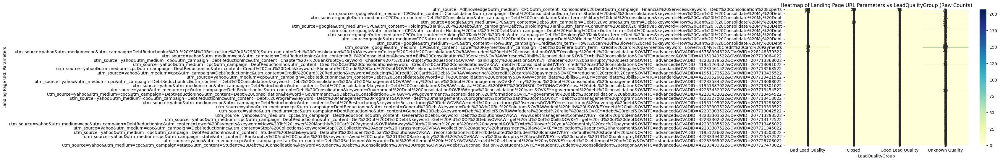

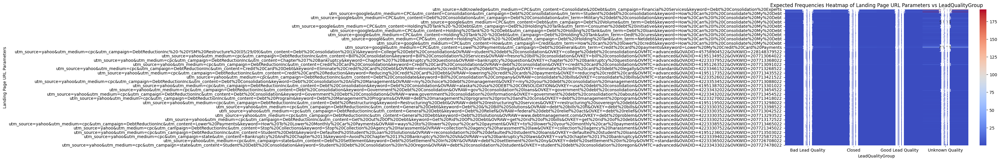

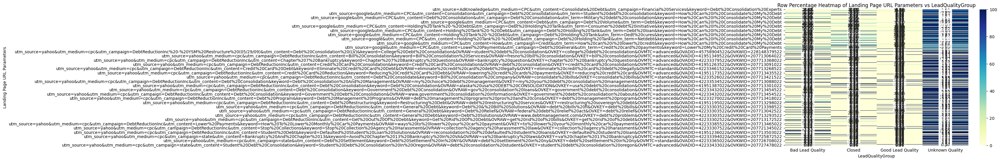

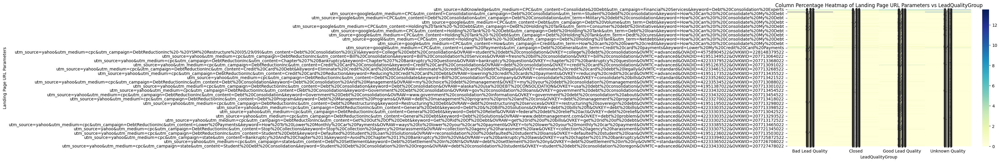


Chi-Square Test Results for Landing Page URL Parameters vs LeadQualityGroup:
Chi-Square Statistic: 3570.037131889667
Degrees of Freedom: 3267
P-value: 0.0001326147874277364

The association between Landing Page URL Parameters and LeadQualityGroup is statistically significant (p < 0.05).


In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# List of columns to analyze (replace with your actual column names)
categorical_columns = [
    "WidgetName","PublisherZoneName", "PublisherCampaignName", "AddressScore", "PhoneScore", 
    "AdvertiserCampaignName", "State", "DebtLevel", "Partner", 
    "ReferralDomain", "MarketingCampaign", "AdGroup", "Keyword", "ReferralURL", "ReferralURL Parameters", 
    "LandingPageURL", "Landing Page URL Parameters"
]

# Store p-values, significance results, and chi-square statistics in a list
p_values = []

# Iterate through each column
for col in categorical_columns:
    print(f"\nAnalyzing Column: {col}\n{'='*40}")

    # Value Counts
    print(f"\nValue Counts for {col}:")
    print(df_sorted[col].value_counts())

    # Contingency Table
    contingency_table = pd.crosstab(df_sorted[col], df_sorted['LeadQualityGroup'])

    # Heatmap of Contingency Table (Raw Counts)
    plt.figure(figsize=(10, 6))
    sns.heatmap(contingency_table, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f"Heatmap of {col} vs LeadQualityGroup (Raw Counts)")
    plt.ylabel(col)
    plt.xlabel("LeadQualityGroup")
    plt.show()

    # Chi-Square Test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Expected Frequencies
    expected_df = pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns)

    # Heatmap of Expected Frequencies
    plt.figure(figsize=(10, 6))
    sns.heatmap(expected_df, annot=True, fmt='.2f', cmap='coolwarm')
    plt.title(f"Expected Frequencies Heatmap of {col} vs LeadQualityGroup")
    plt.ylabel(col)
    plt.xlabel("LeadQualityGroup")
    plt.show()

    # Row Percentage Heatmap
    row_percentage = contingency_table.div(contingency_table.sum(axis=1), axis=0) * 100
    plt.figure(figsize=(10, 6))
    sns.heatmap(row_percentage, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title(f"Row Percentage Heatmap of {col} vs LeadQualityGroup")
    plt.ylabel(col)
    plt.xlabel("LeadQualityGroup")
    plt.show()

    # Column Percentage Heatmap
    col_percentage = contingency_table.div(contingency_table.sum(axis=0), axis=1) * 100
    plt.figure(figsize=(10, 6))
    sns.heatmap(col_percentage, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title(f"Column Percentage Heatmap of {col} vs LeadQualityGroup")
    plt.ylabel(col)
    plt.xlabel("LeadQualityGroup")
    plt.show()

    # Print Chi-Square Test Results
    print(f"\nChi-Square Test Results for {col} vs LeadQualityGroup:")
    print(f"Chi-Square Statistic: {chi2}")
    print(f"Degrees of Freedom: {dof}")
    print(f"P-value: {p}")

    # Check Significance
    alpha = 0.05
    significance = "Significant" if p < alpha else "Not Significant"
    if p < alpha:
        print(f"\nThe association between {col} and LeadQualityGroup is statistically significant (p < {alpha}).")
    else:
        print(f"\nThe association between {col} and LeadQualityGroup is not statistically significant (p >= {alpha}).")

    # Calculate Normalized Chi-square statistic
    normalized_chi2 = chi2 / dof if dof != 0 else 0

    # Store the column name, p-value, significance, chi-square, and normalized chi-square
    p_values.append((col, p, significance, chi2, normalized_chi2))  # Add normalized Chi-square statistic




The following analysis examines the relationship between the input variables and the output variable, using p-value and the normalized Chi-square test statistics to assess both the significance and the strength of the association.

In [20]:
# Convert the stored p-values into a DataFrame for easier comparison
p_values_df = pd.DataFrame(p_values, columns=["Column", "P-value", "Significance", "Chi-Square", "Normalized Chi-Square"])

# Sort the results by p-value (ascending order) to identify the most significant columns
p_values_df = p_values_df.sort_values(by="P-value", ascending=True)

# Display the sorted DataFrame
p_values_df

,Column,P-value,Significance,Chi-Square,Normalized Chi-Square
11,AdGroup,4.388997e-09,Significant,470.333275,1.537037
15,LandingPageURL,2.733058e-08,Significant,59.544070,4.962006
8,Partner,1.455537e-07,Significant,61.384730,4.092315
7,DebtLevel,2.837256e-07,Significant,80.817761,2.993250
0,WidgetName,4.838830e-07,Significant,98.426012,2.523744
2,PublisherCampaignName,1.313219e-04,Significant,20.537486,6.845829
1,PublisherZoneName,1.313219e-04,Significant,20.537486,6.845829
16,Landing Page URL Parameters,1.326148e-04,Significant,3570.037132,1.092757
10,MarketingCampaign,4.328294e-04,Significant,99.402483,1.743903
4,PhoneScore,3.688633e-02,Significant,22.056963,1.838080


### Key Question 3: 

If the advertiser says they will increase our CPL by 20% (i.e., $30 to $33) if we increase our lead quality by 20% (i.e., from 8.0% to 9.6%), do we see any opportunities to do that here? What kinds of things could we do?

In [21]:
# Get the percentage share of each value in the "LeadQualityGroup" column
percentage_share = df_sorted["LeadQualityGroup"].value_counts(normalize=True) * 100

# Display the percentage share
percentage_share


LeadQualityGroup
Unknown Quality      70.837471
Bad Lead Quality     16.153592
Closed                8.109897
Good Lead Quality     4.899040
Name: proportion, dtype: float64

To increase lead quality from 8.1% to 9.6% based on the provided data, we need to focus on the columns that show significant relationships with the outcome of interest. 

The columns with a significant p-value (typically less than 0.05) indicate a statistically significant relationship with the outcome.

These columns are statistically significant and could potentially be leveraged to improve lead quality.

Opportunities for Improvement

- AdGroup and MarketingCampaign: Since these are significant, optimizing ad groups and marketing campaigns could directly impact lead quality. This might involve refining targeting criteria, adjusting ad spend, or testing different ad creatives.

- LandingPageURL and Landing Page URL Parameters: These are highly significant, suggesting that changes to the landing page could have a substantial impact. Consider A/B testing different landing page designs, content, or calls to action to see what improves lead quality.

- Partner and PublisherCampaignName: Collaborating with partners or optimizing publisher campaigns could also be beneficial. This might involve negotiating better terms with partners or refining the targeting and content of publisher campaigns.

- DebtLevel and PhoneScore: These factors might relate to the quality of leads based on their financial status or contactability. Adjusting criteria for lead acceptance or enhancing the scoring model could improve overall lead quality.

Conclusion:

By focusing on these significant factors, you can explore various strategies to potentially increase lead quality by 20%. This could involve a combination of optimizing marketing strategies, refining targeting, and improving landing page effectiveness.